In [2]:
import os
import tensorflow as tf
import numpy as np
import math
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_moons, make_circles
from IPython.display import display, clear_output

/home/jdh/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
def make_data_moons(n_samples=1000, shuffle=True, noise=.05):
    x, y = make_moons(n_samples, shuffle, noise, random_state=42)
    x[:,1][y==0] = x[:,1][y==0]#+.5
    return x, np.identity(y.max()+1)[y]

In [4]:
def make_data_spiral(n_samples=1000, shuffle=True, noise=.05, radius=1, out_shift=1):
    theta = np.sqrt(np.random.rand(n_samples)) * 2 * np.pi # np.linspace(0,2*pi,100)

    r_a = 2*theta + np.pi
    data_a = np.array([np.cos(theta)*r_a, np.sin(theta)*r_a]).T
    x_a = data_a + noise * np.random.randn(n_samples, 2)

    r_b = -2*theta - np.pi
    data_b = np.array([np.cos(theta)*r_b, np.sin(theta)*r_b]).T
    x_b = data_b + noise * np.random.randn(n_samples, 2)

    res_a = np.append(x_a, np.zeros((n_samples, 1)), axis=1)
    res_b = np.append(x_b, np.ones((n_samples, 1)), axis=1)

    res = np.append(res_a, res_b, axis=0)
    np.random.shuffle(res)
    
    examples = radius * res[:, :2] / np.abs(res[:, :2]).max()
    labels = np.identity(res[:, 2].astype(int).max() + 1)[res[:, 2].astype(int)]
    return examples, labels

### (THIS RESEARCH IS GOING TO BE PUBLISHED AS A DISTIL PUBLICATION)

# Introduction

In this study we seek to explain how deep hierarchical latent variable models (DLVM) can detect out-of-distribution data (OOD). Nalisnick et al., 2018 have recently shown emperical results showing that Flow models, Autoregressive models, and VAE models, have failed in doing exactly this. Nalisnick et al., 2019 provide an explanation to why VAEs cannot detect OOD, denoted _typicality_, which assumes that this family of density models will _force_ the samples, despite being anomal from the training distribution, into a _known_ mode. Thereby the evaluated likelihood, in this case the evidence lower bound (ELBO), will in many cases not be significantly smaller than the one evaluated on the training dataset. Nalisnick et al., 2019 propose to use goodness-of-fit testing on the VAE in order to test for OOD.

Contrary to Nalisnick et al., 2019, Maaløe et al., 2019 have shown that DLVMs can in fact be used for OOD detection on complex image datasets. By utilizing a very deep hierarchy of latent variables (>20 layers) and a looser bound to the ELBO they show that they can in fact use the model and the approximated likelihood to detect OOD.

In this research we will expand on the findings by Nalisnick et al., 2018, Nalisnick et al., 2019, and Maaløe et al., 2019 to investigate how DLVMs can perform OOD detection. The contributions are:

1) An example of the lack in detecting OOD data within the paradigm of discriminative models. We also define a Bayesian neural network and show how these cannot detect OOD distributions accurately, despite having a better variance estimate. (Note: I'm not sure whether this is needed)

2) An analysis of the latent representation of a regular 1-layered VAE and Auxiliary VAE (AVAE) on a synthetic dataset. We show that the AVAE is in fact able to learn a more complex distribution than a regular factorized VAE, due to a learned covariance structure between the latent variables, $a$ and $z$. Contrarily to Nalisnick et al., 2019 we show that both models are able to detect OOD data, from the ELBO, on a synthetic dataset. 

3) By adding a classifier to the setting of an AVAE we show that one can utilize the ELBO for classification with accompanying uncertainty estimates for OOD data points.

4) Finally, we apply the above findings on multiple image datasets and one audio dataset. We find that the 1-layered VAE is not able to detect OOD data points, similar to the findings of Nalisnick et al., 2019. However, similarly to the findings of Maaløe et al., 2019, we also find that by adding additional latent variables we can in fact detect OOD data points due to the model being more flexible in generating from outside of the mode, thus the _typicality_ constraint is alleviated.

# Datasets

## Synthetic datasets

First we make 3 synthetic datasets, _train_, _test1_, and _test2_, coming originating from the same data generation processes: two overlapping full circles.

In [5]:
#x1, y1 = make_data_moons(n_samples=10000, shuffle=True, noise=.0)
x1, y1 = make_data_spiral(n_samples=10000, shuffle=True, noise=.05)
y1 = np.argmax(y1, -1)
y1_onehot = np.eye(2)[y1]

In [6]:
x2, y2 = make_data_spiral(n_samples=10000, shuffle=True, noise=.05, radius=0.8)
y2 = np.argmax(y2, -1)
y2_onehot = np.eye(2)[y2]

In [5]:
x2, y2 = make_circles(10000, shuffle=True, noise=.0)

x3 = x2[y2==0]
x3[:, 0] += 1.
x3[:, 1] += .5
y3 = y2[y2==0]
y3[:] = 1.

x2 = x2[y2==0]
y2 = y2[y2==0]
y2[:] = 0.

x2 = np.concatenate([x2, x3], axis=0)
y2 = np.concatenate([y2, y3], axis=0)
y2_onehot = np.eye(2)[y2]

In [6]:
x3, y3 = make_circles(10000, shuffle=True, noise=.0)

x4 = x3[y3==1]
x4[:, 0] += 1.
x4[:, 1] += .5
y4 = y3[y3==0]
y4[:] = 1.

x3 = x3[y3==1]
y3 = y3[y3==1]
y3[:] = 0.

x3 = np.concatenate([x3, x4], axis=0)
y3 = np.concatenate([y3, y4], axis=0)
y3_onehot = np.eye(2)[y3]

## Make corresponding meshgrids

In [7]:
nx, ny = (50, 50)
x = np.linspace(np.min(x1[:,0]), np.max(x1[:,0]), nx)
y = np.linspace(np.min(x1[:,1]), np.max(x1[:,1]), ny)
xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
x_meshgrid = []
for i in range(nx):   
    for j in range(ny):
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if not i == 0:
            x_meshgrid += [[xv[j,i-1], yv[j,i-1]]]
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if not j == 0:
            x_meshgrid += [[xv[j-1,i], yv[j-1,i]]]
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if j == ny-1:
            for k in range(ny):
                x_meshgrid += [[xv[ny-(k+1),i], yv[ny-(k+1),i]]]

x1_meshgrid = np.array(x_meshgrid)

In [8]:
nx, ny = (50, 50)
x = np.linspace(np.min(x2[:,0]), np.max(x2[:,0]), nx)
y = np.linspace(np.min(x2[:,1]), np.max(x2[:,1]), ny)
xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
x_meshgrid = []
for i in range(nx):   
    for j in range(ny):
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if not i == 0:
            x_meshgrid += [[xv[j,i-1], yv[j,i-1]]]
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if not j == 0:
            x_meshgrid += [[xv[j-1,i], yv[j-1,i]]]
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if j == ny-1:
            for k in range(ny):
                x_meshgrid += [[xv[ny-(k+1),i], yv[ny-(k+1),i]]]
                
x2_meshgrid = np.array(x_meshgrid)

In [9]:
nx, ny = (50, 50)
x = np.linspace(np.min(x3[:,0]), np.max(x3[:,0]), nx)
y = np.linspace(np.min(x3[:,1]), np.max(x3[:,1]), ny)
xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
x_meshgrid = []
for i in range(nx):   
    for j in range(ny):
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if not i == 0:
            x_meshgrid += [[xv[j,i-1], yv[j,i-1]]]
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if not j == 0:
            x_meshgrid += [[xv[j-1,i], yv[j-1,i]]]
        x_meshgrid += [[xv[j,i], yv[j,i]]]
        if j == ny-1:
            for k in range(ny):
                x_meshgrid += [[xv[ny-(k+1),i], yv[ny-(k+1),i]]]
                
x3_meshgrid = np.array(x_meshgrid)

NameError: name 'x3' is not defined

## Plot datasets

In [11]:
train_0 = 'C0' # (231/255, 76/255, 60/255)
train_1 = 'C1' # (46./255, 204./255, 113./255)

test1_0 = 'C2' #(192/255., 57/255., 43/255.)
test1_1 = 'C3' #(39./255., 174./255., 96./255.)

test2_0 = 'C4' #(211./255., 84./255., 0./255.)
test2_1 = 'C5' #(22./255., 160./255., 133./255.)

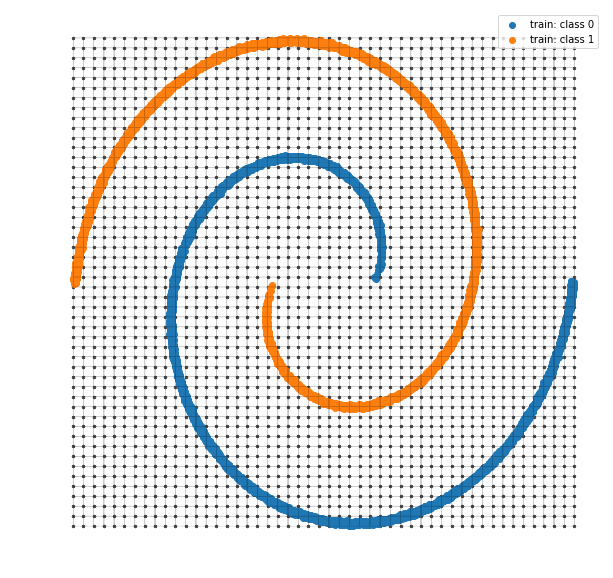

In [12]:
fig = plt.figure(figsize=(10, 10))
ax1 = fig.add_subplot(1, 1, 1)

ax1.plot(x1_meshgrid[:,0], x1_meshgrid[:,1], c="black", alpha=.2, linewidth=.5)
ax1.scatter(x1_meshgrid[:,0], x1_meshgrid[:,1], c=[(.3, .3, .3, .3)], alpha=.5, s=5.)

ax1.scatter(x1[y1==0,0], x1[y1==0,1], c=[train_0], label="train: class 0")
ax1.scatter(x1[y1==1,0], x1[y1==1,1], c=[train_1], label="train: class 1")
ax1.axis('off')
plt.legend()

plt.show()

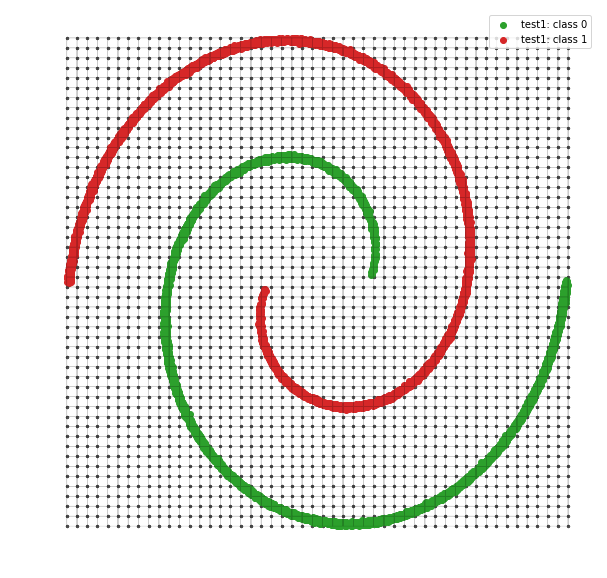

In [14]:
fig = plt.figure(figsize=(10, 10))
ax1 = fig.add_subplot(1, 1, 1)

ax1.plot(x2_meshgrid[:,0], x2_meshgrid[:,1], c="black", alpha=.2, linewidth=.5)
ax1.scatter(x2_meshgrid[:,0], x2_meshgrid[:,1], c=[(.3, .3, .3, .3)], alpha=.5, s=5.)

ax1.scatter(x2[y2==0,0], x2[y2==0,1], c=[test1_0], label="test1: class 0")
ax1.scatter(x2[y2==1,0], x2[y2==1,1], c=[test1_1], label="test1: class 1")


ax1.axis('off')
plt.legend()
plt.show()

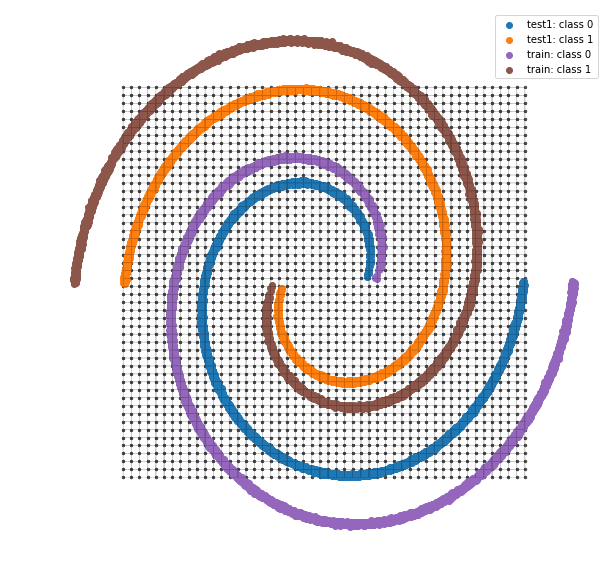

In [15]:
fig = plt.figure(figsize=(10, 10))
ax1 = fig.add_subplot(1, 1, 1)

ax1.plot(x2_meshgrid[:,0], x2_meshgrid[:,1], c="black", alpha=.2, linewidth=.5)
ax1.scatter(x2_meshgrid[:,0], x2_meshgrid[:,1], c=[(.3, .3, .3, .3)], alpha=.5, s=5.)

ax1.scatter(x2[y2==0,0], x2[y2==0,1], c=[train_0], label="test1: class 0")
ax1.scatter(x2[y2==1,0], x2[y2==1,1], c=[train_1], label="test1: class 1")

#ax1.scatter(x3[y3==0,0], x3[y3==0,1], c=[test1_0], label="test2: class 0")
#ax1.scatter(x3[y3==1,0], x3[y3==1,1], c=[test1_1], label="test2: class 1")

ax1.scatter(x1[y1==0,0], x1[y1==0,1], c=[test2_0], label="train: class 0")
ax1.scatter(x1[y1==1,0], x1[y1==1,1], c=[test2_1], label="train: class 1")

ax1.axis('off')
plt.legend()
plt.show()

## Image datasets


We perform experiments on MNIST, FashionMNIST, OMNIGLOT, and CIFAR-10 (Note: I'm not sure whether we need CIFAR-10).

# 1) Discriminative Models

## Define a discriminative classification model

In [15]:
d_ph_x = tf.placeholder(tf.float32, (None, 2))
d_ph_y = tf.placeholder(tf.int32, (None, 2))
# identity init = nice for visualization
d_h1 = tf.layers.dense(d_ph_x, 32, activation=tf.nn.tanh, kernel_initializer=tf.initializers.identity)
d_h1 = tf.layers.dense(d_h1, 16, activation=tf.nn.tanh, kernel_initializer=tf.initializers.identity)
d_h1 = tf.layers.dense(d_h1, 8, activation=tf.nn.tanh, kernel_initializer=tf.initializers.identity)
d_h2 = tf.layers.dense(d_h1, 2, activation=None, kernel_initializer=tf.initializers.identity)

d_y = tf.layers.dense(d_h2, 2, activation=None)
d_y_softmax = tf.nn.softmax(d_y)
#d_y = d_h2
#d_y_softmax = tf.nn.softmax(d_h2)

d_op_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(labels=d_ph_y, logits=d_y))
d_op_acc, d_op_acc_updt = tf.metrics.accuracy(labels=tf.argmax(d_ph_y, 1), predictions=tf.argmax(d_y_softmax,1))
d_op_acc = tf.reduce_mean(d_op_acc)
d_op_opt = tf.train.AdamOptimizer(1e-3).minimize(d_op_loss)
sess = tf.Session()
sess.run(tf.global_variables_initializer())
sess.run(tf.local_variables_initializer())

## Train the discriminative model

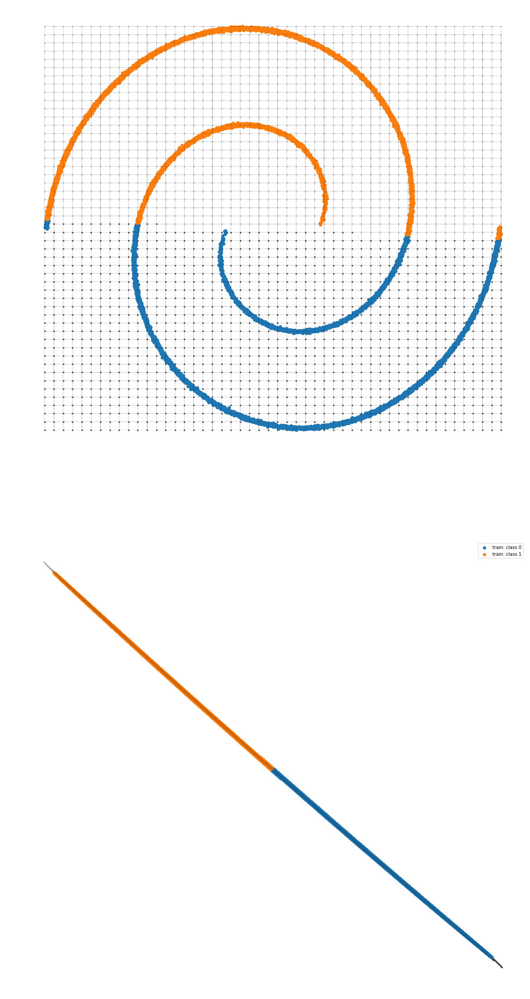

In [16]:
if not os.path.exists('discriminative_out'):
    os.makedirs('discriminative_out')

updates = 10000
batch_size = 32

fig = plt.figure(figsize=(20, 40))
ax1 = fig.add_subplot(2, 1, 1)
ax2 = fig.add_subplot(2, 1, 2)

count = 0

losses = []
accuracies = []
for i in range(updates):
    batch_idx = np.random.choice(len(x1), batch_size, replace=False)
    batch_x, batch_y = x1[batch_idx], y1_onehot[batch_idx]
    loss, acc, _ = sess.run([d_op_loss, d_op_acc, [d_op_opt, d_op_acc_updt]], feed_dict={d_ph_x: batch_x, d_ph_y: batch_y})
    losses += [loss]
    accuracies += [acc]
    
    if i % 50 == 0:
        loss, acc, _ = sess.run([d_op_loss, d_op_acc, d_op_acc_updt], feed_dict={d_ph_x: batch_x, d_ph_y: batch_y})
        print("Update: {}/{}, Loss: {:.2}, Acc: {:.3}".format(i, updates, np.mean(loss), np.mean(acc)), end='\r')

        # Plot decision boundary of input distribution
        ax1.cla()
        out_y_mesh1 = sess.run(d_y_softmax, feed_dict={d_ph_x: x1_meshgrid})
        out_y_mesh1 = out_y_mesh1.argmax(-1)
        out_y_x1 = sess.run(d_y_softmax, feed_dict={d_ph_x: x1})
        out_y_x1 = out_y_x1.argmax(-1)
        
        ax1.plot(x1_meshgrid[:,0], x1_meshgrid[:,1], c="black", alpha=.2, linewidth=.5)

        ax1.scatter(x1_meshgrid[out_y_mesh1==0,0], x1_meshgrid[out_y_mesh1==0,1], c=[(.3, .3, .3, .3)], alpha=.5, s=5.)
        ax1.scatter(x1_meshgrid[out_y_mesh1==1,0], x1_meshgrid[out_y_mesh1==1,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
        ax1.scatter(x1[out_y_x1==0,0], x1[out_y_x1==0,1], c=[train_0])
        ax1.scatter(x1[out_y_x1==1,0], x1[out_y_x1==1,1], c=[train_1])
        
        # Plot decision boundary of hidden distribution
        ax2.cla()
        out_hidden_mesh1, out_y_mesh1 = sess.run([d_h2, d_y_softmax], feed_dict={d_ph_x: x1_meshgrid})
        out_y_mesh1 = out_y_mesh1.argmax(-1)
        out_hidden_x1, out_y_x1 = sess.run([d_h2, d_y_softmax], feed_dict={d_ph_x: x1})
        out_y_x1 = out_y_x1.argmax(-1)
        
        ax2.plot(out_hidden_mesh1[:,0], out_hidden_mesh1[:,1], c="black", alpha=.2, linewidth=.5)
        
        ax2.scatter(out_hidden_mesh1[out_y_mesh1==0,0], out_hidden_mesh1[out_y_mesh1==0,1], c=[(.3, .3, .3, .3)], alpha=.5, s=5.)
        ax2.scatter(out_hidden_mesh1[out_y_mesh1==1,0], out_hidden_mesh1[out_y_mesh1==1,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
        ax2.scatter(out_hidden_x1[out_y_x1==0,0], out_hidden_x1[out_y_x1==0,1], c=[train_0], label="train: class 0")
        ax2.scatter(out_hidden_x1[out_y_x1==1,0], out_hidden_x1[out_y_x1==1,1], c=[train_1], label="train: class 1")
            
        ax1.axis('off')
        ax2.axis('off')
        plt.legend()
        count += 1
        plt.savefig("discriminative_out/%i.png"%(count), format="png", transparent=True)

## Present overly confident discriminative model

In [17]:
out_y_mesh2 = np.argmax(sess.run(d_y_softmax, feed_dict={d_ph_x:x2_meshgrid}), axis=-1)
out_y_x2 = np.argmax(sess.run(d_y_softmax, feed_dict={d_ph_x: x2}), axis=-1)
out_y_x1 = np.argmax(sess.run(d_y_softmax, feed_dict={d_ph_x: x1}), axis=-1)

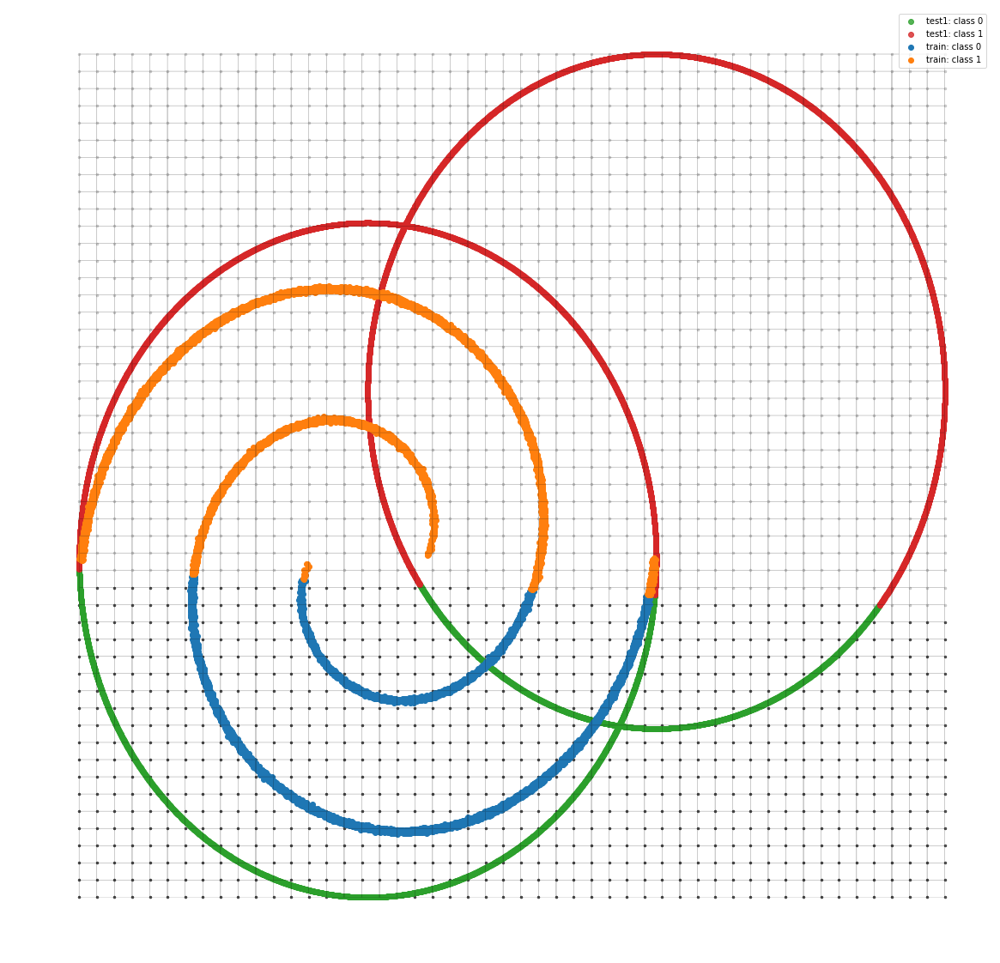

In [18]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

ax1.plot(x2_meshgrid[:,0], x2_meshgrid[:,1], c="black", alpha=.2, linewidth=.5)
ax1.scatter(x2_meshgrid[out_y_mesh2==0,0], x2_meshgrid[out_y_mesh2==0,1], c=[(.3, .3, .3, .3)], alpha=.5, s=5.)
ax1.scatter(x2_meshgrid[out_y_mesh2==1,0], x2_meshgrid[out_y_mesh2==1,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.scatter(x2[out_y_x2==0,0], x2[out_y_x2==0,1], c=[test1_0], alpha=.8, label="test1: class 0")
ax1.scatter(x2[out_y_x2==1,0], x2[out_y_x2==1,1], c=[test1_1], alpha=.8, label="test1: class 1")

ax1.scatter(x1[out_y_x1==0,0], x1[out_y_x1==0,1], c=[train_0], label="train: class 0")
ax1.scatter(x1[out_y_x1==1,0], x1[out_y_x1==1,1], c=[train_1], label="train: class 1")
        
ax1.axis('off')
plt.legend()
p=plt.savefig("discriminative_out/generalisation_input.png", transparent=True)

In [19]:
out_hidden_mesh1, out_y_mesh1 = sess.run([d_h2, d_y_softmax], feed_dict={d_ph_x: x1_meshgrid})
out_y_mesh1 = out_y_mesh1.argmax(-1)
out_hidden_x1, out_y_x1 = sess.run([d_h2, d_y_softmax], feed_dict={d_ph_x: x1})
out_y_x1 = out_y_x1.argmax(-1)

out_hidden_mesh2, out_y_mesh2 = sess.run([d_h2, d_y_softmax], feed_dict={d_ph_x: x2_meshgrid})
out_y_mesh2 = out_y_mesh2.argmax(-1)
out_hidden_x2, out_y_x2 = sess.run([d_h2, d_y_softmax], feed_dict={d_ph_x: x2})
out_y_x2 = out_y_x2.argmax(-1)


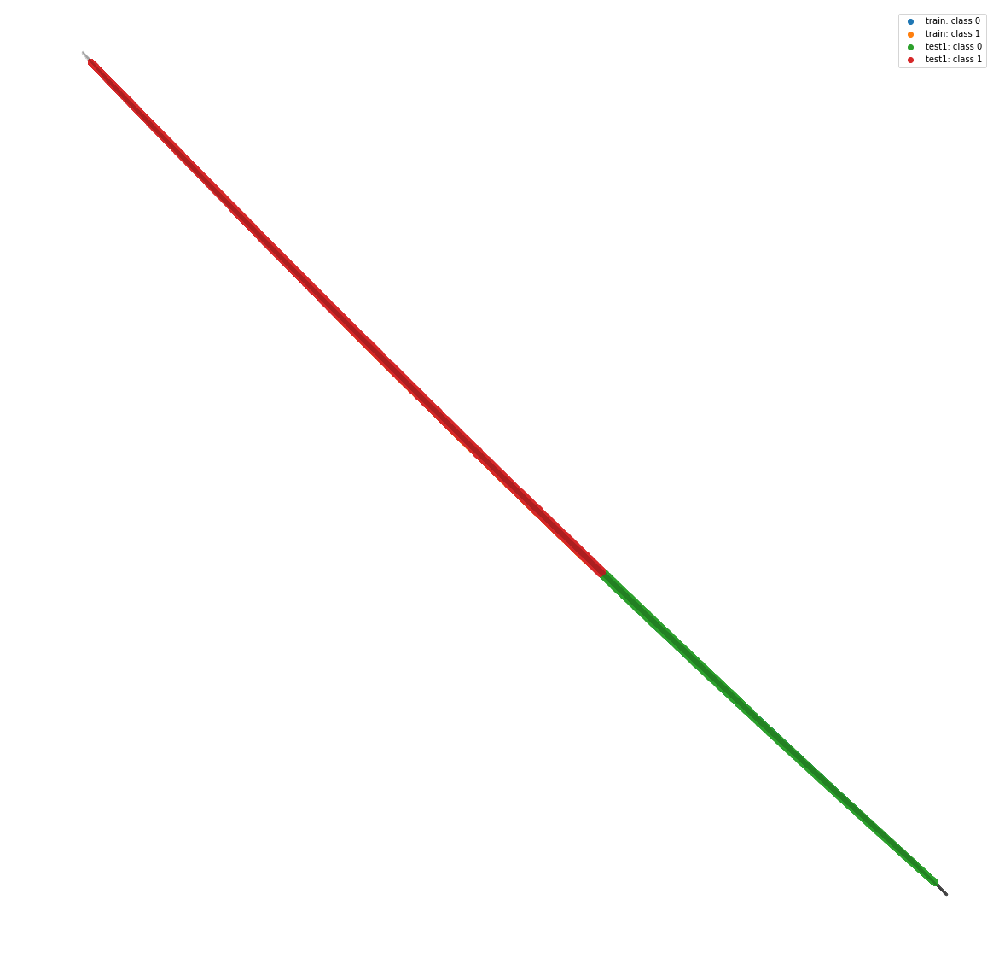

In [20]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

ax1.scatter(out_hidden_x1[out_y_x1==0,0], out_hidden_x1[out_y_x1==0,1], c=[train_0], label="train: class 0")
ax1.scatter(out_hidden_x1[out_y_x1==1,0], out_hidden_x1[out_y_x1==1,1], c=[train_1], label="train: class 1")

ax1.plot(out_hidden_mesh2[:,0], out_hidden_mesh2[:,1], c="black", alpha=.2, linewidth=.5)
ax1.scatter(out_hidden_mesh2[out_y_mesh2==0,0], out_hidden_mesh2[out_y_mesh2==0,1], c=[(.3, .3, .3, .3)], alpha=.5, s=5.)
ax1.scatter(out_hidden_mesh2[out_y_mesh2==1,0], out_hidden_mesh2[out_y_mesh2==1,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
ax1.scatter(out_hidden_x2[out_y_x2==0,0], out_hidden_x2[out_y_x2==0,1], c=[test1_0], label="test1: class 0")
ax1.scatter(out_hidden_x2[out_y_x2==1,0], out_hidden_x2[out_y_x2==1,1], c=[test1_1], label="test1: class 1")
        
ax1.axis('off')
plt.legend()
p=plt.savefig("discriminative_out/generalisation_manifold.png", transparent=True)

## Decision boundary

Plotting scale 1:1.
Plotting scale 3:1.


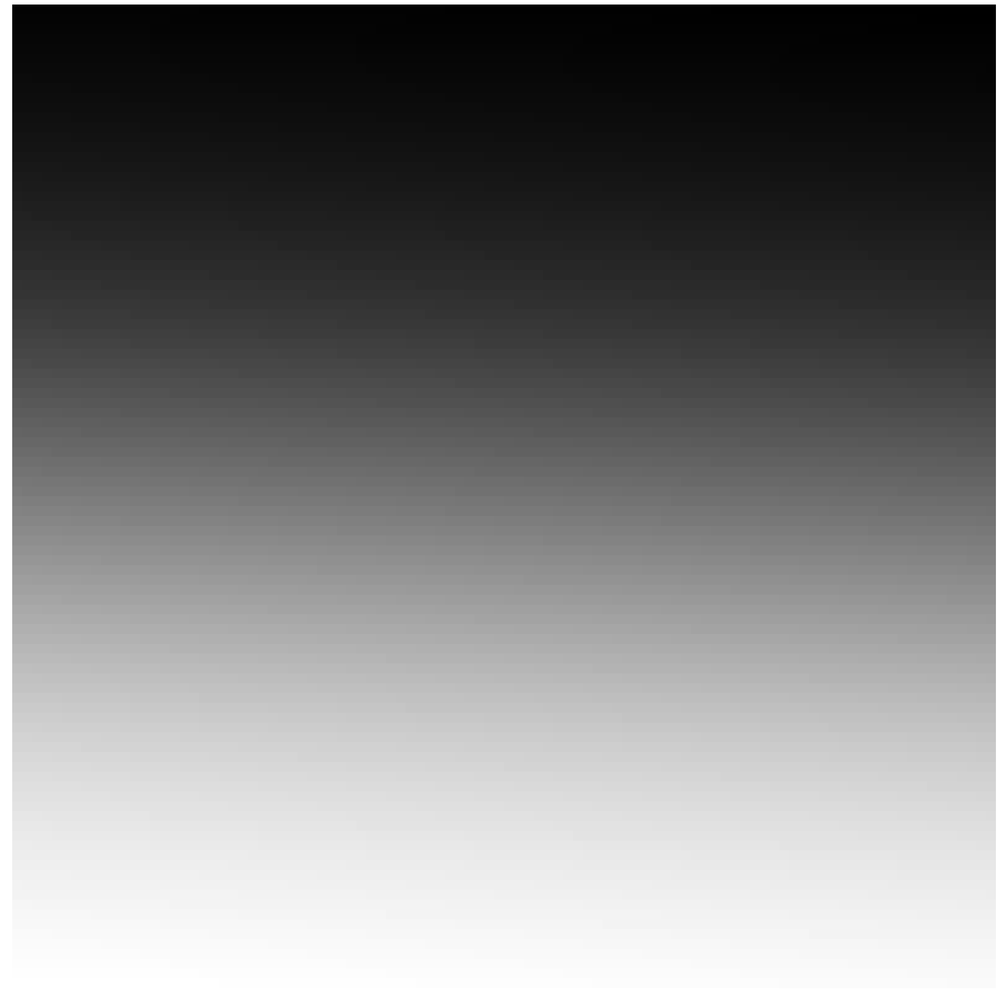

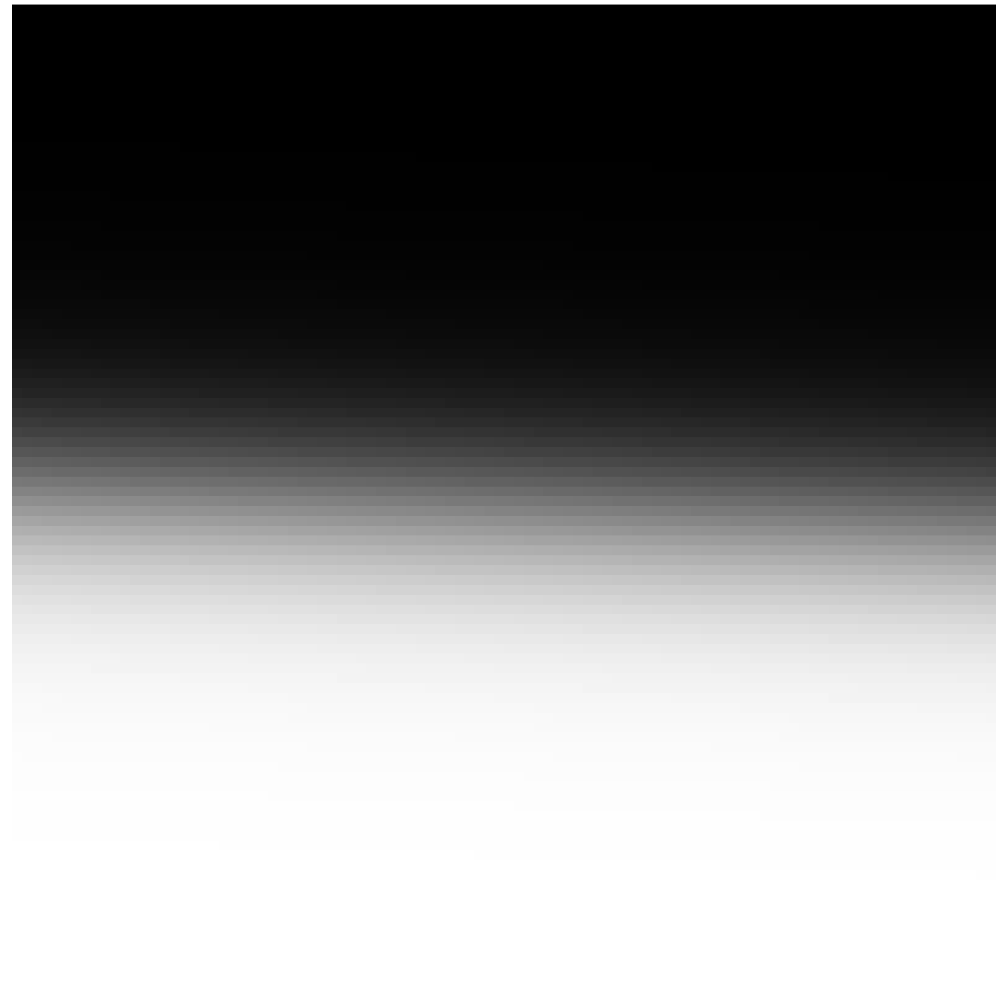

In [21]:
nx, ny = (100, 100)


def f(multiplier):
    x_min, x_max =  np.min(x1[:,0]) - multiplier, multiplier + np.max(x1[:,0]) 
    y_min, y_max = np.min(x1[:,1]) - multiplier, multiplier + np.max(x1[:,1])
    return [x_min, x_max, y_min, y_max]

for i in [0, 2]:
    print("Plotting scale %i:1."%(i+1))
    x_min, x_max, y_min, y_max = f(i*1)

    x = np.linspace(x_min, x_max, nx)
    y = np.linspace(y_min, y_max, ny)
    xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
    zv = np.zeros(xv.shape)
    for j in range(x.shape[0]):
        inp = np.append(xv[:, j:j+1], yv[:, j:j+1], axis=1)
        zv[:, j] = sess.run(d_y_softmax[:,0], feed_dict={d_ph_x: inp}).reshape(-1)[::-1]

    plt.figure(figsize=(40, 40))
    #sns.heatmap(zv)
    plt.imshow(zv, cmap=matplotlib.cm.get_cmap('binary_r'))
    #plt.colorbar()
    plt.axis(aspect='image');
    plt.axis('off')
    plt.savefig(f"discriminative_out/distplot_{i}_{nx}.png", format="png", transparent=True)

# 2) VAE and AVAE for OOD detection

## Define LVM layers and distributions

In [22]:
c = - 0.5 * math.log(2 * math.pi)

non_lin = tf.nn.tanh
kernel_init = tf.glorot_uniform_initializer(np.sqrt(2.))
def stochastic(x, dim):
    mu = tf.layers.dense(x, dim, kernel_initializer=tf.glorot_normal_initializer(np.sqrt(2.)), activation=lambda x: x)
    #mu = tf.layers.batch_normalization(mu)
    sigma = tf.layers.dense(x, dim, kernel_initializer=tf.glorot_normal_initializer(np.sqrt(2.)), activation=lambda x: x)
    #sigma = tf.layers.batch_normalization(sigma)
    eps = tf.random_normal(tf.shape(mu), mean=0., stddev=1., seed=1234)
    z = mu + tf.exp(0.5 * sigma) * eps
    return z, mu, sigma

def dense(x, dim, non_lin=non_lin):
    d = tf.layers.dense(x, dim, kernel_initializer=tf.glorot_uniform_initializer(np.sqrt(2.)), activation=None)
    #d = tf.layers.batch_normalization(d)
    d = non_lin(d)
    return d

def log_normal(x, mean, var):
    log_pdf = c - var / 2 - (x - mean) ** 2 / (2 * tf.exp(var))
    return tf.reduce_sum(log_pdf, axis=-1, keepdims=True)

def log_standard_normal(x):
    return tf.reduce_sum(c - x ** 2 / 2, axis=-1, keepdims=True)

## VAE

In [23]:
n_layers = 2
h_dim = 64
z_dim = 2

# Input placeholders
vae_ph_kl_temp = tf.placeholder(tf.float32)
vae_ph_iw = tf.placeholder(tf.int32)
vae_ph_x = tf.placeholder(tf.float32, (None, 2))
vae_ph_x_repeat = tf.tile(tf.expand_dims(vae_ph_x, 1), [1, vae_ph_iw, 1])
vae_ph_x_repeat = tf.reshape(vae_ph_x_repeat, [-1, 2])

# Variational inference network q(z|x)
h1 = vae_ph_x_repeat
for i in range(n_layers):
    h1 = dense(h1, h_dim)
vae_qz, vae_qz_mu, vae_qz_sigma = stochastic(h1, z_dim)

# Generative distribution p(x|z)
h2 = vae_qz
for i in range(n_layers):
    h2 = dense(h2, h_dim)
vae_px, vae_px_mu, vae_px_sigma = stochastic(h2, 2)

# Losses
vae_op_kl = (log_standard_normal(vae_qz)) - (log_normal(vae_qz, vae_qz_mu, vae_qz_sigma))
vae_op_px = log_normal(vae_ph_x_repeat, vae_px_mu, vae_px_sigma)
vae_op_loss = tf.reshape(vae_op_px + vae_ph_kl_temp * vae_op_kl, [-1, vae_ph_iw, 1])


vae_op_loss_max = tf.reduce_max(vae_op_loss, axis=1, keepdims=True)
vae_op_loss = tf.log(tf.reduce_mean(tf.exp(vae_op_loss - vae_op_loss_max), axis=1, keepdims=True)) + vae_op_loss_max

vae_op_kl_mean = tf.reduce_mean(vae_op_kl)
vae_op_px_mean = tf.reduce_mean(vae_op_px)
vae_op_loss_mean = tf.reduce_mean(vae_op_loss)

vae_op_opt = tf.train.AdamOptimizer(3e-4).minimize(-vae_op_loss_mean)

## Auxiliary VAE

In [58]:
n_layers = 3
h1_dim = 64
h2_dim = 32
a_dim = 3
z_dim = 2

# Placeholders
avae_ph_kl_temp = tf.placeholder(tf.float32)
avae_ph_iw = tf.placeholder(tf.int32)
avae_ph_x = tf.placeholder(tf.float32, (None, 2))
avae_ph_x_repeat = tf.tile(tf.expand_dims(avae_ph_x, 1), [1, avae_ph_iw, 1])
avae_ph_x_repeat = tf.reshape(avae_ph_x_repeat, [-1, 2])

# Auxilliary variable inference network q(a|x)
h1 = avae_ph_x_repeat
for i in range(n_layers):
    h1 = dense(h1, h1_dim)
avae_qa, avae_qa_mu, avae_qa_sigma = stochastic(h1, a_dim)

# Inference network q(z|x)
h2 = tf.concat([avae_qa, dense(avae_ph_x_repeat, a_dim)], axis=-1) # Connection from input and avae to latent
for i in range(n_layers):
    h2 = dense(h2, h2_dim)
avae_qz, avae_qz_mu, avae_qz_sigma = stochastic(h2, z_dim)

# Generative model p(a|z)
h2 = avae_qz
for i in range(n_layers):
    h2 = dense(h2, h2_dim)
avae_pa, avae_pa_mu, avae_pa_sigma = stochastic(h2, a_dim)

# Generative model p(x|z)
h1 = avae_qz
for i in range(n_layers):
    h1 = dense(h1, h1_dim)
avae_px, avae_px_mu, avae_px_sigma = stochastic(h1, 2)


avae_op_kl_z = (log_standard_normal(avae_qz)) - (log_normal(avae_qz, avae_qz_mu, avae_qz_sigma))
avae_op_kl_a = (log_normal(avae_qa, avae_pa_mu, avae_pa_sigma)) - (log_normal(avae_qa, avae_qa_mu, avae_qa_sigma))

avae_op_kl = avae_op_kl_z + tf.minimum(-0.1, avae_op_kl_a)  # Free bits ??
avae_op_px = log_normal(avae_ph_x_repeat, avae_px_mu, avae_px_sigma)
avae_op_loss = tf.reshape(avae_op_px + avae_ph_kl_temp * avae_op_kl, [-1, avae_ph_iw, 1])

avae_op_loss_max = tf.reduce_max(avae_op_loss, axis=1, keepdims=True)
avae_op_loss = tf.log(tf.reduce_mean(tf.exp(avae_op_loss - avae_op_loss_max), axis=1, keepdims=True)) + avae_op_loss_max

avae_op_kl_mean = tf.reduce_mean(avae_op_kl)
avae_op_px_mean = tf.reduce_mean(avae_op_px)
avae_op_loss_mean = tf.reduce_mean(avae_op_loss)

avae_op_opt = tf.train.AdamOptimizer(3e-4).minimize(-avae_op_loss_mean)

## Initialize and train models

In [59]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
sess.run(tf.local_variables_initializer())

In [60]:
def lvm_train_loop(ph_x, ph_iw, ph_kl_temp, op_loss, op_kl, op_opt, x_train, epochs=100, kl_temps=[1.], bs=32, iw=10):
    count = 0
    upds = len(x_train)//bs
    losses = []
    kls = []
    for i in range(epochs):
        for j in range(upds):
            kl_temp = kl_temps.pop(0) if len(kl_temps)>1 else 1.
            batch_idx = np.random.choice(len(x_train), bs, replace=False)
            batch_x = x_train[batch_idx]
           
            loss, kl, _ = sess.run([op_loss, op_kl, op_opt], feed_dict={ph_x: batch_x, ph_kl_temp: kl_temp, ph_iw: iw})
            
            losses += [loss]
            kls += [kl]

            
        print("Epoch: {}/{}, Loss: {:.4}, KL: {:.4}.".format(i, epochs, np.mean(losses[-upds:]), np.mean(kls[-upds:])))#, end='\r') 


### Train VAE

In [28]:
iw = 10
epochs = 500
lvm_train_loop(vae_ph_x, vae_ph_iw, vae_ph_kl_temp, vae_op_loss_mean, vae_op_kl_mean, vae_op_opt, x1, epochs=epochs, kl_temps=[1.], bs=32, iw=iw)

Epoch: 0/500, Loss: -1.672, KL: -0.07864.
Epoch: 1/500, Loss: -1.501, KL: -0.2599.
Epoch: 2/500, Loss: -1.425, KL: -0.5487.
Epoch: 3/500, Loss: -1.265, KL: -1.338.
Epoch: 4/500, Loss: -1.128, KL: -2.056.
Epoch: 5/500, Loss: -1.098, KL: -2.228.
Epoch: 6/500, Loss: -1.081, KL: -2.329.
Epoch: 7/500, Loss: -1.058, KL: -2.345.
Epoch: 8/500, Loss: -1.05, KL: -2.393.
Epoch: 9/500, Loss: -1.025, KL: -2.402.
Epoch: 10/500, Loss: -0.9972, KL: -2.437.
Epoch: 11/500, Loss: -0.9649, KL: -2.483.
Epoch: 12/500, Loss: -0.9394, KL: -2.496.
Epoch: 13/500, Loss: -0.9017, KL: -2.548.
Epoch: 14/500, Loss: -0.8681, KL: -2.585.
Epoch: 15/500, Loss: -0.826, KL: -2.572.
Epoch: 16/500, Loss: -0.7845, KL: -2.61.
Epoch: 17/500, Loss: -0.7116, KL: -2.612.
Epoch: 18/500, Loss: -0.6933, KL: -2.637.
Epoch: 19/500, Loss: -0.6456, KL: -2.666.
Epoch: 20/500, Loss: -0.6075, KL: -2.692.
Epoch: 21/500, Loss: -0.5765, KL: -2.713.
Epoch: 22/500, Loss: -0.5104, KL: -2.825.
Epoch: 23/500, Loss: -0.4863, KL: -2.805.
Epoch: 24/5

Epoch: 197/500, Loss: 0.8034, KL: -4.046.
Epoch: 198/500, Loss: 0.8044, KL: -4.101.
Epoch: 199/500, Loss: 0.8169, KL: -3.982.
Epoch: 200/500, Loss: 0.7988, KL: -4.056.
Epoch: 201/500, Loss: 0.8344, KL: -4.068.
Epoch: 202/500, Loss: 0.8088, KL: -4.016.
Epoch: 203/500, Loss: 0.773, KL: -3.984.
Epoch: 204/500, Loss: 0.8028, KL: -4.012.
Epoch: 205/500, Loss: 0.8475, KL: -4.143.
Epoch: 206/500, Loss: 0.843, KL: -4.116.
Epoch: 207/500, Loss: 0.8595, KL: -4.083.
Epoch: 208/500, Loss: 0.8716, KL: -4.119.
Epoch: 209/500, Loss: 0.8607, KL: -4.187.
Epoch: 210/500, Loss: 0.8562, KL: -4.131.
Epoch: 211/500, Loss: 0.8889, KL: -4.092.
Epoch: 212/500, Loss: 0.8688, KL: -4.078.
Epoch: 213/500, Loss: 0.8888, KL: -4.103.
Epoch: 214/500, Loss: 0.8954, KL: -4.122.
Epoch: 215/500, Loss: 0.8812, KL: -4.109.
Epoch: 216/500, Loss: 0.8938, KL: -4.136.
Epoch: 217/500, Loss: 0.8623, KL: -4.098.
Epoch: 218/500, Loss: 0.8718, KL: -4.121.
Epoch: 219/500, Loss: 0.7851, KL: -3.999.
Epoch: 220/500, Loss: 0.8762, KL: -4

Epoch: 396/500, Loss: 1.254, KL: -4.5.
Epoch: 397/500, Loss: 1.228, KL: -4.455.
Epoch: 398/500, Loss: 1.255, KL: -4.447.
Epoch: 399/500, Loss: 1.243, KL: -4.454.
Epoch: 400/500, Loss: 1.252, KL: -4.483.
Epoch: 401/500, Loss: 1.25, KL: -4.492.
Epoch: 402/500, Loss: 1.26, KL: -4.462.
Epoch: 403/500, Loss: 1.277, KL: -4.467.
Epoch: 404/500, Loss: 1.258, KL: -4.486.
Epoch: 405/500, Loss: 1.264, KL: -4.46.
Epoch: 406/500, Loss: 1.268, KL: -4.496.
Epoch: 407/500, Loss: 1.268, KL: -4.471.
Epoch: 408/500, Loss: 1.24, KL: -4.397.
Epoch: 409/500, Loss: 1.247, KL: -4.425.
Epoch: 410/500, Loss: 1.254, KL: -4.419.
Epoch: 411/500, Loss: 1.267, KL: -4.44.
Epoch: 412/500, Loss: 1.289, KL: -4.488.
Epoch: 413/500, Loss: 1.293, KL: -4.537.
Epoch: 414/500, Loss: 1.257, KL: -4.512.
Epoch: 415/500, Loss: 1.299, KL: -4.548.
Epoch: 416/500, Loss: 1.281, KL: -4.521.
Epoch: 417/500, Loss: 1.284, KL: -4.464.
Epoch: 418/500, Loss: 1.293, KL: -4.54.
Epoch: 419/500, Loss: 1.29, KL: -4.486.
Epoch: 420/500, Loss: 1.3

### Train AVAE

In [ ]:
iw = 10
epochs = 1000
lvm_train_loop(avae_ph_x, avae_ph_iw, avae_ph_kl_temp, avae_op_loss_mean, avae_op_kl_mean, avae_op_opt, x1, epochs=epochs, kl_temps=[1.], bs=32, iw=iw)


Epoch: 0/1000, Loss: -1.757, KL: -0.1401.
Epoch: 1/1000, Loss: -1.599, KL: -0.2903.
Epoch: 2/1000, Loss: -1.533, KL: -0.4882.
Epoch: 3/1000, Loss: -1.371, KL: -0.977.
Epoch: 4/1000, Loss: -1.299, KL: -1.378.
Epoch: 5/1000, Loss: -1.257, KL: -1.543.
Epoch: 6/1000, Loss: -1.22, KL: -1.677.
Epoch: 7/1000, Loss: -1.158, KL: -1.777.
Epoch: 8/1000, Loss: -1.014, KL: -1.91.
Epoch: 9/1000, Loss: -0.9103, KL: -1.93.
Epoch: 10/1000, Loss: -0.8276, KL: -1.953.
Epoch: 11/1000, Loss: -0.781, KL: -1.963.
Epoch: 12/1000, Loss: -0.7524, KL: -1.995.
Epoch: 13/1000, Loss: -0.7273, KL: -2.033.
Epoch: 14/1000, Loss: -0.7004, KL: -2.036.
Epoch: 15/1000, Loss: -0.6954, KL: -2.074.
Epoch: 16/1000, Loss: -0.6303, KL: -2.185.
Epoch: 17/1000, Loss: -0.6197, KL: -2.221.
Epoch: 18/1000, Loss: -0.5447, KL: -2.311.
Epoch: 19/1000, Loss: -0.5263, KL: -2.36.
Epoch: 20/1000, Loss: -0.4841, KL: -2.386.
Epoch: 21/1000, Loss: -0.4442, KL: -2.497.
Epoch: 22/1000, Loss: -0.4234, KL: -2.545.
Epoch: 23/1000, Loss: -0.367, KL

Epoch: 196/1000, Loss: 1.363, KL: -4.306.
Epoch: 197/1000, Loss: 1.409, KL: -4.345.
Epoch: 198/1000, Loss: 1.39, KL: -4.431.
Epoch: 199/1000, Loss: 1.41, KL: -4.408.
Epoch: 200/1000, Loss: 1.422, KL: -4.356.
Epoch: 201/1000, Loss: 1.422, KL: -4.4.
Epoch: 202/1000, Loss: 1.381, KL: -4.37.
Epoch: 203/1000, Loss: 1.401, KL: -4.359.
Epoch: 204/1000, Loss: 1.407, KL: -4.433.
Epoch: 205/1000, Loss: 1.405, KL: -4.468.
Epoch: 206/1000, Loss: 1.383, KL: -4.458.
Epoch: 207/1000, Loss: 1.395, KL: -4.417.
Epoch: 208/1000, Loss: 1.4, KL: -4.452.
Epoch: 209/1000, Loss: 1.269, KL: -4.342.
Epoch: 210/1000, Loss: 1.38, KL: -4.238.
Epoch: 211/1000, Loss: 1.42, KL: -4.328.
Epoch: 212/1000, Loss: 1.403, KL: -4.454.
Epoch: 213/1000, Loss: 1.411, KL: -4.436.
Epoch: 214/1000, Loss: 1.443, KL: -4.45.
Epoch: 215/1000, Loss: 1.437, KL: -4.467.
Epoch: 216/1000, Loss: 1.403, KL: -4.386.
Epoch: 217/1000, Loss: 1.431, KL: -4.367.
Epoch: 218/1000, Loss: 1.423, KL: -4.409.
Epoch: 219/1000, Loss: 1.429, KL: -4.414.
Ep

Epoch: 392/1000, Loss: 1.583, KL: -4.491.
Epoch: 393/1000, Loss: 1.613, KL: -4.547.
Epoch: 394/1000, Loss: 1.604, KL: -4.569.
Epoch: 395/1000, Loss: 1.607, KL: -4.497.
Epoch: 396/1000, Loss: 1.623, KL: -4.522.
Epoch: 397/1000, Loss: 1.589, KL: -4.626.
Epoch: 398/1000, Loss: 1.624, KL: -4.572.
Epoch: 399/1000, Loss: 1.612, KL: -4.494.
Epoch: 400/1000, Loss: 1.587, KL: -4.433.
Epoch: 401/1000, Loss: 1.604, KL: -4.403.
Epoch: 402/1000, Loss: 1.585, KL: -4.499.
Epoch: 403/1000, Loss: 1.611, KL: -4.435.
Epoch: 404/1000, Loss: 1.196, KL: -4.351.
Epoch: 405/1000, Loss: 1.599, KL: -4.379.
Epoch: 406/1000, Loss: 1.594, KL: -4.39.
Epoch: 407/1000, Loss: 1.6, KL: -4.363.
Epoch: 408/1000, Loss: 1.347, KL: -4.447.
Epoch: 409/1000, Loss: 1.538, KL: -4.355.
Epoch: 410/1000, Loss: 1.609, KL: -4.403.
Epoch: 411/1000, Loss: 1.655, KL: -4.433.
Epoch: 412/1000, Loss: 1.638, KL: -4.463.
Epoch: 413/1000, Loss: 1.63, KL: -4.451.
Epoch: 414/1000, Loss: 1.611, KL: -4.448.
Epoch: 415/1000, Loss: 1.631, KL: -4.4

## Visualize latent space

In the following plots we should see that the latent space of the VAE is following an isotropic Gaussian due to the standard normal prior and that the AVAE learns a more complex distribution due to its two latent variables.

### VAE

In [29]:
out_qz_mu_x1 = sess.run(vae_qz_mu, feed_dict={vae_ph_x: x1, vae_ph_iw: 1})
out_qz_mu_x2 = sess.run(vae_qz_mu, feed_dict={vae_ph_x: x2, vae_ph_iw: 1})
out_qz_mu_mesh = sess.run(vae_qz_mu, feed_dict={vae_ph_x: x2_meshgrid, vae_ph_iw: 1})

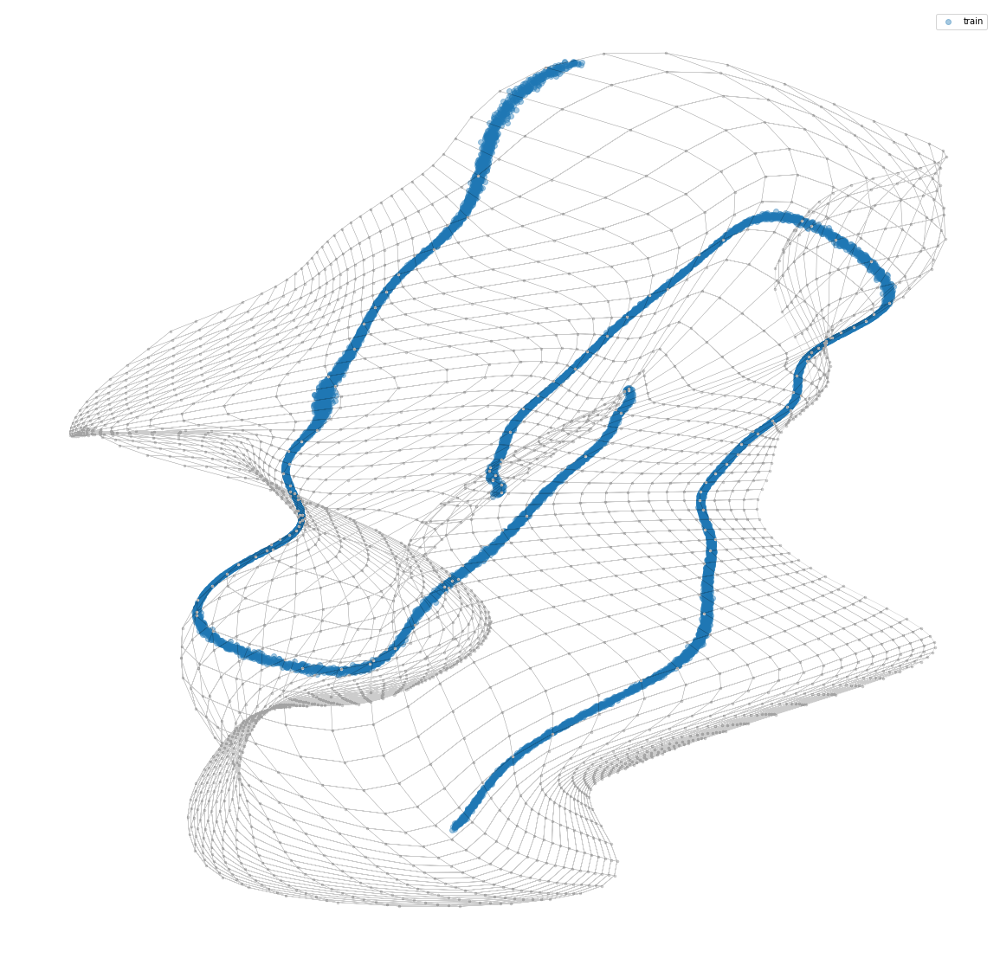

In [30]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

#ax1.scatter(out_qz_mu_x2[:,0], out_qz_mu_x2[:,1], c=[test1_0], alpha=0.4, label="test1")
ax1.scatter(out_qz_mu_x1[:,0], out_qz_mu_x1[:,1], c=[train_0], alpha=0.4, label="train")

ax1.plot(out_qz_mu_mesh[:,0], out_qz_mu_mesh[:,1], c="black", alpha=.2, linewidth=.5)

ax1.scatter(out_qz_mu_mesh[:,0], out_qz_mu_mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.axis('off')
plt.legend()
plt.show()

In [31]:
iw = 10
out_qz_mu_x1 = sess.run(vae_qz, feed_dict={vae_ph_x: x1, vae_ph_iw: iw}).reshape(-1, iw, z_dim).mean(axis=1)
out_qz_mu_x2 = sess.run(vae_qz, feed_dict={vae_ph_x: x2, vae_ph_iw: iw}).reshape(-1, iw, z_dim).mean(axis=1)
out_qz_mu_mesh = sess.run(vae_qz, feed_dict={vae_ph_x: x2_meshgrid, vae_ph_iw: iw}).reshape(-1, iw, 2).mean(axis=1)

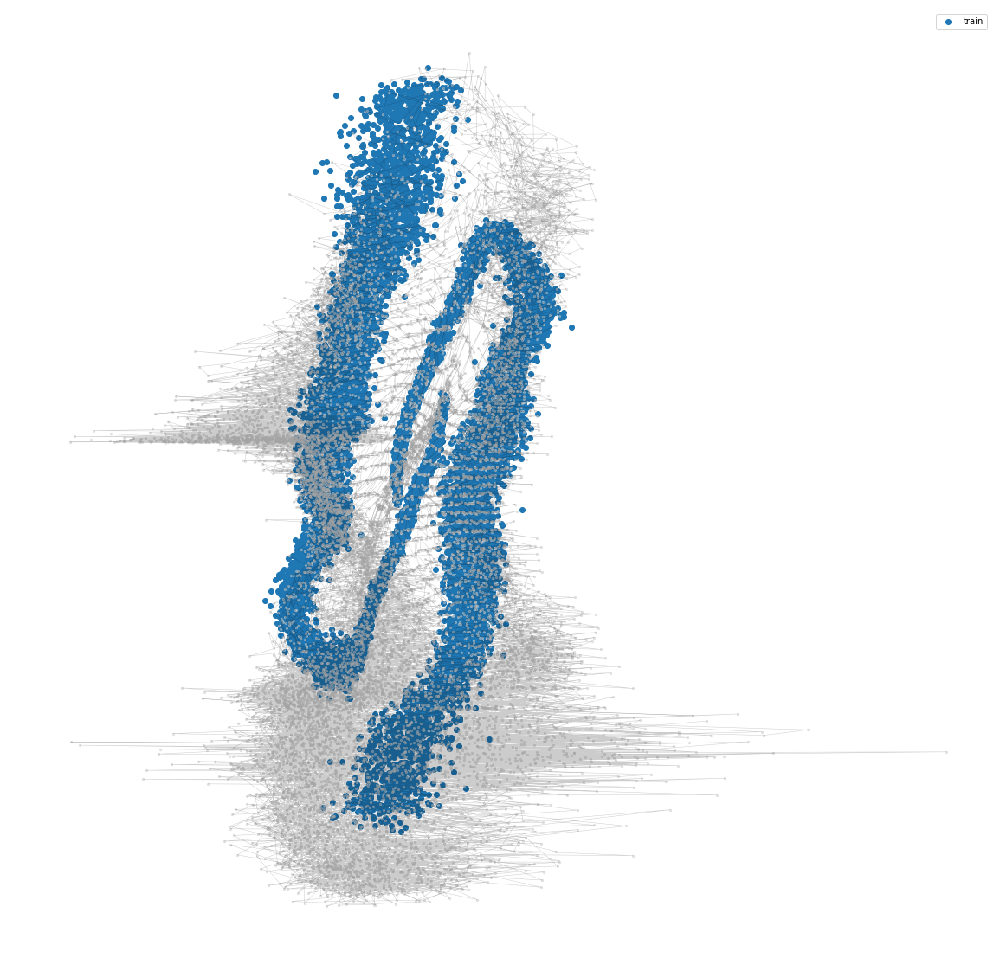

In [32]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

#ax1.scatter(out_qz_mu_x2[:,0], out_qz_mu_x2[:,1], c=[test1_0], label="test1")
ax1.scatter(out_qz_mu_x1[:,0], out_qz_mu_x1[:,1], c=[train_0], label="train")

ax1.plot(out_qz_mu_mesh[:,0], out_qz_mu_mesh[:,1], c="black", alpha=.2, linewidth=.5)

ax1.scatter(out_qz_mu_mesh[:,0], out_qz_mu_mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.axis('off')
plt.legend()
plt.show()

### AVAE

In [54]:
out_qa_mu_x1 = sess.run(avae_qa_mu, feed_dict={avae_ph_x: x1, avae_ph_iw: 1})
out_qa_mu_x2 = sess.run(avae_qa_mu, feed_dict={avae_ph_x: x2, avae_ph_iw: 1})
out_qa_mu_mesh = sess.run(avae_qa_mu, feed_dict={avae_ph_x: x2_meshgrid, avae_ph_iw: 1})

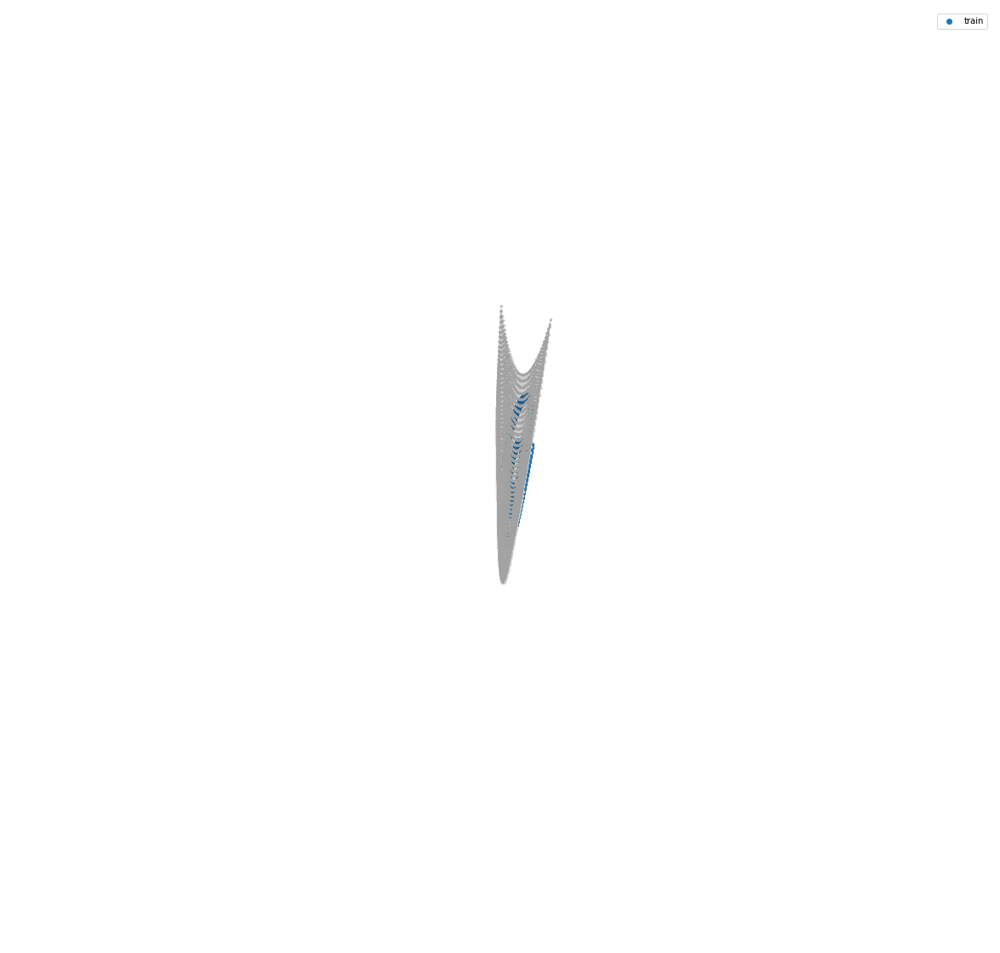

In [55]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

#ax1.scatter(out_qa_mu_x2[:,0], out_qa_mu_x2[:,1], c=[test1_0], label="test1")
ax1.scatter(out_qa_mu_x1[:,0], out_qa_mu_x1[:,1], c=[train_0], label="train")

ax1.plot(out_qa_mu_mesh[:,0], out_qa_mu_mesh[:,1], c="black", alpha=.2, linewidth=.5)

ax1.scatter(out_qa_mu_mesh[:,0], out_qa_mu_mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.axis('off')
plt.legend()
plt.show()

In [56]:
out_qz_mu_x1 = sess.run(avae_qz_mu, feed_dict={avae_qa: out_qa_mu_x1, avae_ph_x: x1, avae_ph_iw: 1})
out_qz_mu_x2 = sess.run(avae_qz_mu, feed_dict={avae_qa: out_qa_mu_x2, avae_ph_x: x2, avae_ph_iw: 1})
out_qz_mu_mesh = sess.run(avae_qz_mu, feed_dict={avae_qa: out_qa_mu_mesh, avae_ph_x: x2_meshgrid, avae_ph_iw: 1})

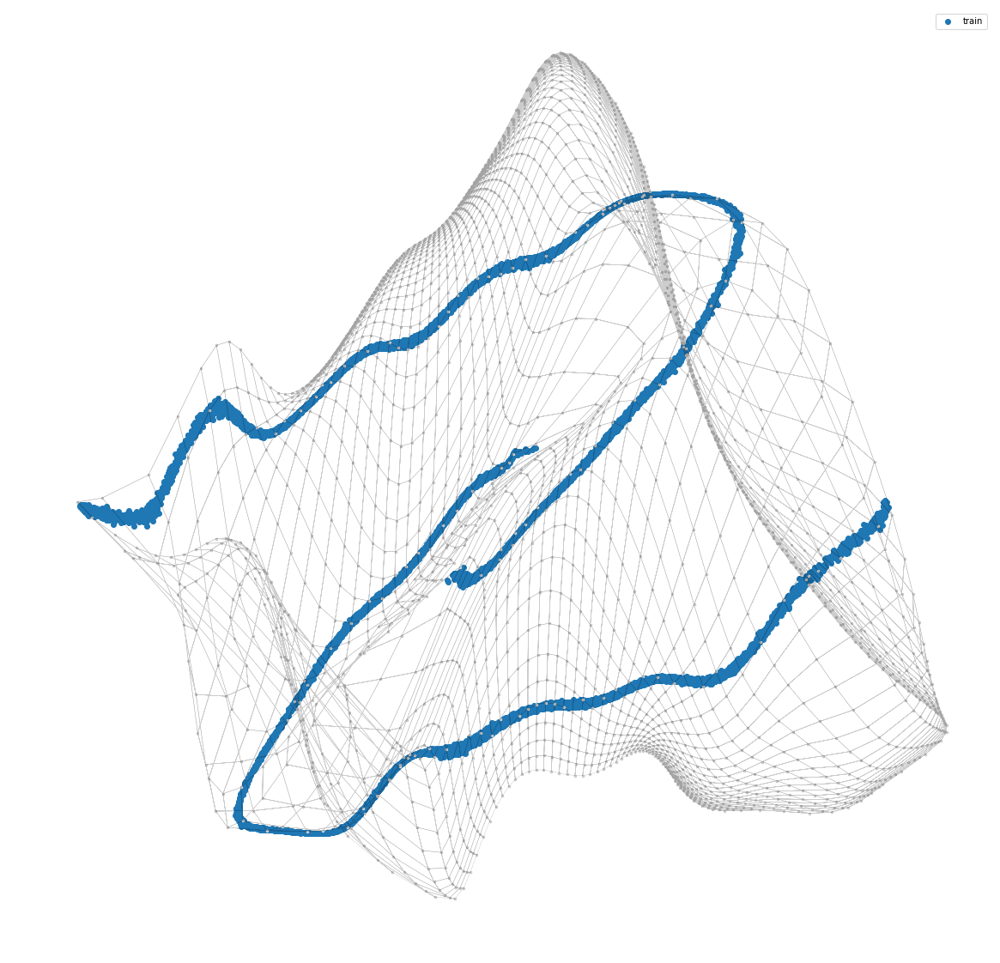

In [57]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

ax1.scatter(out_qz_mu_x1[:,0], out_qz_mu_x1[:,1], c=[train_0], label="train")
#ax1.scatter(out_qz_mu_x2[:,0], out_qz_mu_x2[:,1], c=[test1_0], label="test1")

ax1.plot(out_qz_mu_mesh[:,0], out_qz_mu_mesh[:,1], c="black", alpha=.2, linewidth=.5)

ax1.scatter(out_qz_mu_mesh[:,0], out_qz_mu_mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.axis('off')
plt.legend()
plt.show()

In [37]:
iw = 10
out_qa_x1 = sess.run(avae_qa, feed_dict={avae_ph_x: x1, avae_ph_iw: iw}).reshape(-1, iw, a_dim).mean(axis=1)
out_qa_x2 = sess.run(avae_qa, feed_dict={avae_ph_x: x2, avae_ph_iw: iw}).reshape(-1, iw, a_dim).mean(axis=1)
out_qa_mesh = sess.run(avae_qa, feed_dict={avae_ph_x: x2_meshgrid, avae_ph_iw: iw}).reshape(-1, iw, a_dim).mean(axis=1)

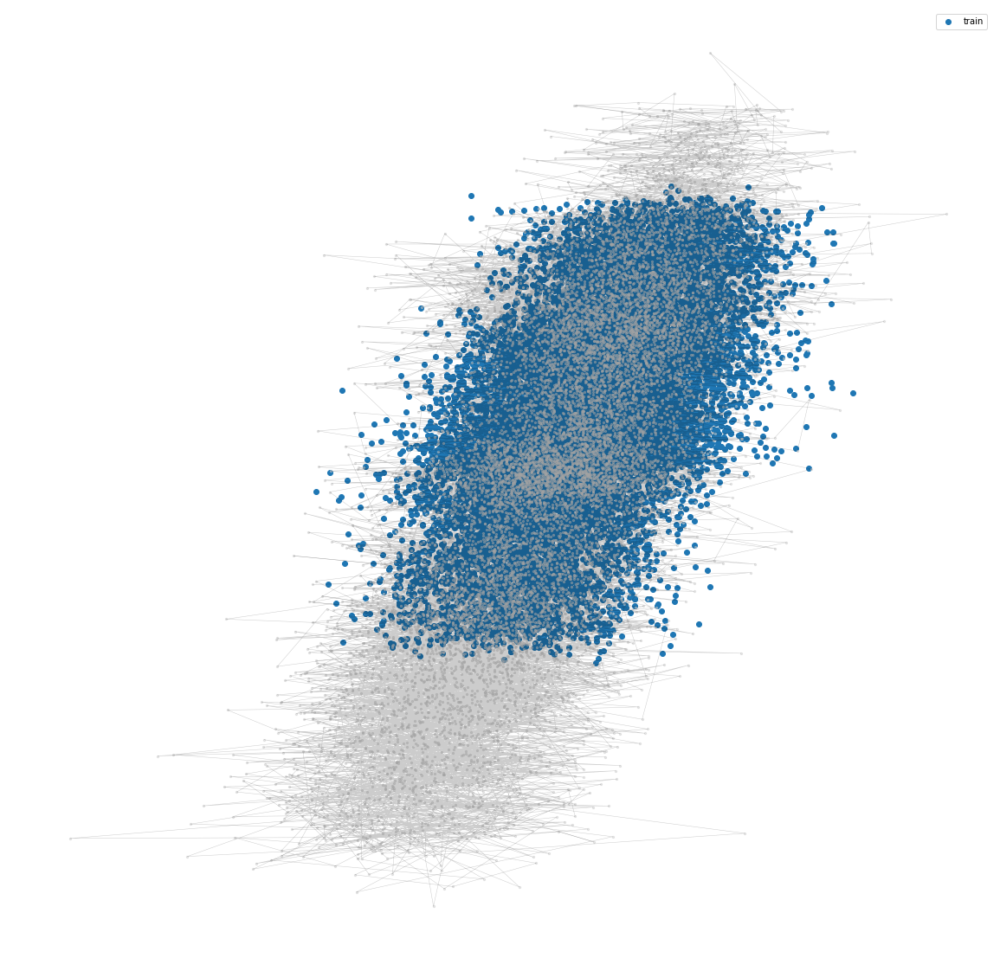

In [38]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

ax1.scatter(out_qa_x1[:,0], out_qa_x1[:,1], c=[train_0], label="train")
#ax1.scatter(out_qa_x2[:,0], out_qa_x2[:,1], c=[test1_0], label="test1")

ax1.plot(out_qa_mesh[:,0], out_qa_mesh[:,1], c="black", alpha=.2, linewidth=.5)

ax1.scatter(out_qa_mesh[:,0], out_qa_mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.axis('off')
plt.legend()
plt.show()

In [39]:
iw = 10
out_qz_x1 = sess.run(avae_qz, feed_dict={avae_ph_x: x1, avae_ph_iw: iw}).reshape(-1, iw, z_dim).mean(axis=1)
out_qz_x2 = sess.run(avae_qz, feed_dict={avae_ph_x: x2, avae_ph_iw: iw}).reshape(-1, iw, z_dim).mean(axis=1)
out_qz_mesh = sess.run(avae_qz, feed_dict={avae_ph_x: x2_meshgrid, avae_ph_iw: iw}).reshape(-1, iw, z_dim).mean(axis=1)

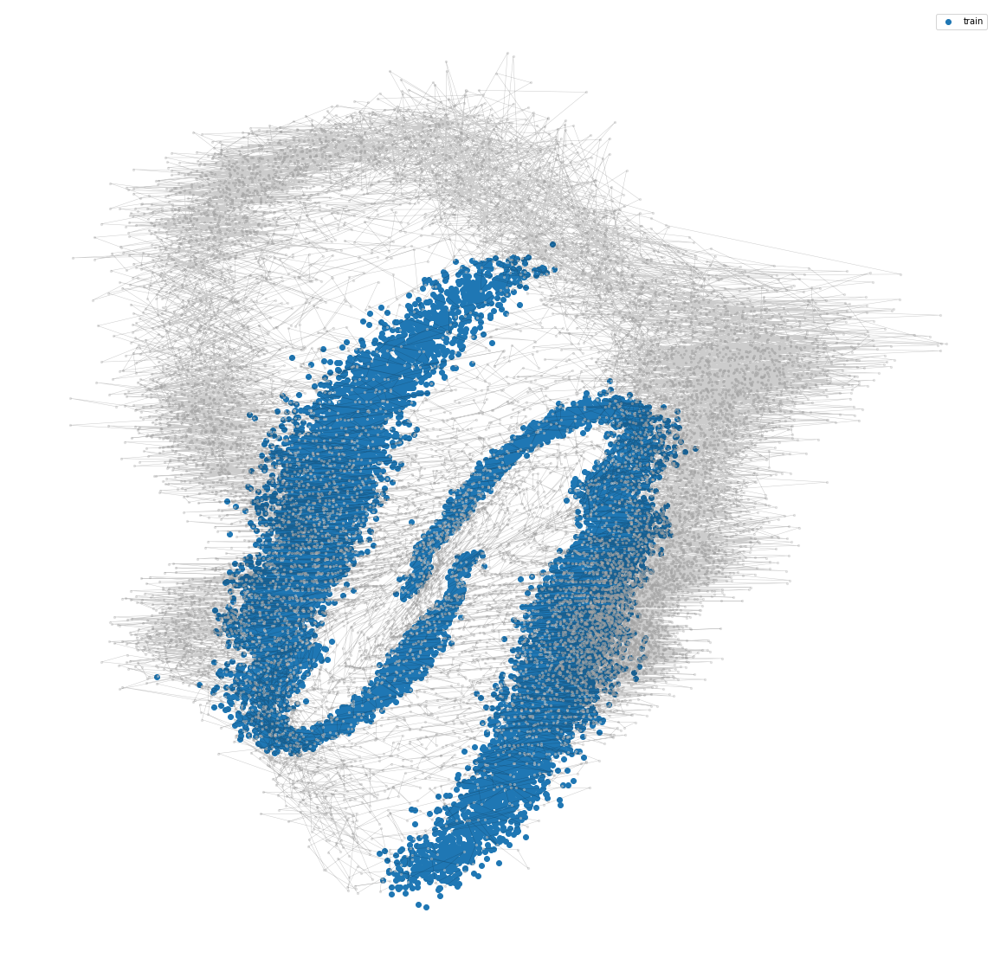

In [40]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

ax1.scatter(out_qz_x1[:,0], out_qz_x1[:,1], c=[train_0], label="train")
#ax1.scatter(out_qz_x2[:,0], out_qz_x2[:,1], c=[test1_0], label="test1")

ax1.plot(out_qz_mesh[:,0], out_qz_mesh[:,1], c="black", alpha=.2, linewidth=.5)

ax1.scatter(out_qz_mesh[:,0], out_qz_mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.axis('off')
plt.legend()
plt.show()

## Generate samples

### VAE

In [41]:
iw = 100
samples = np.expand_dims(np.random.normal(0., 1., (10000, 2)), 1).repeat(iw, 1).reshape(-1, z_dim)
out_px_samples = sess.run(vae_px_mu, feed_dict={vae_qz: samples}).reshape(-1, iw, x1.shape[-1]).mean(1)

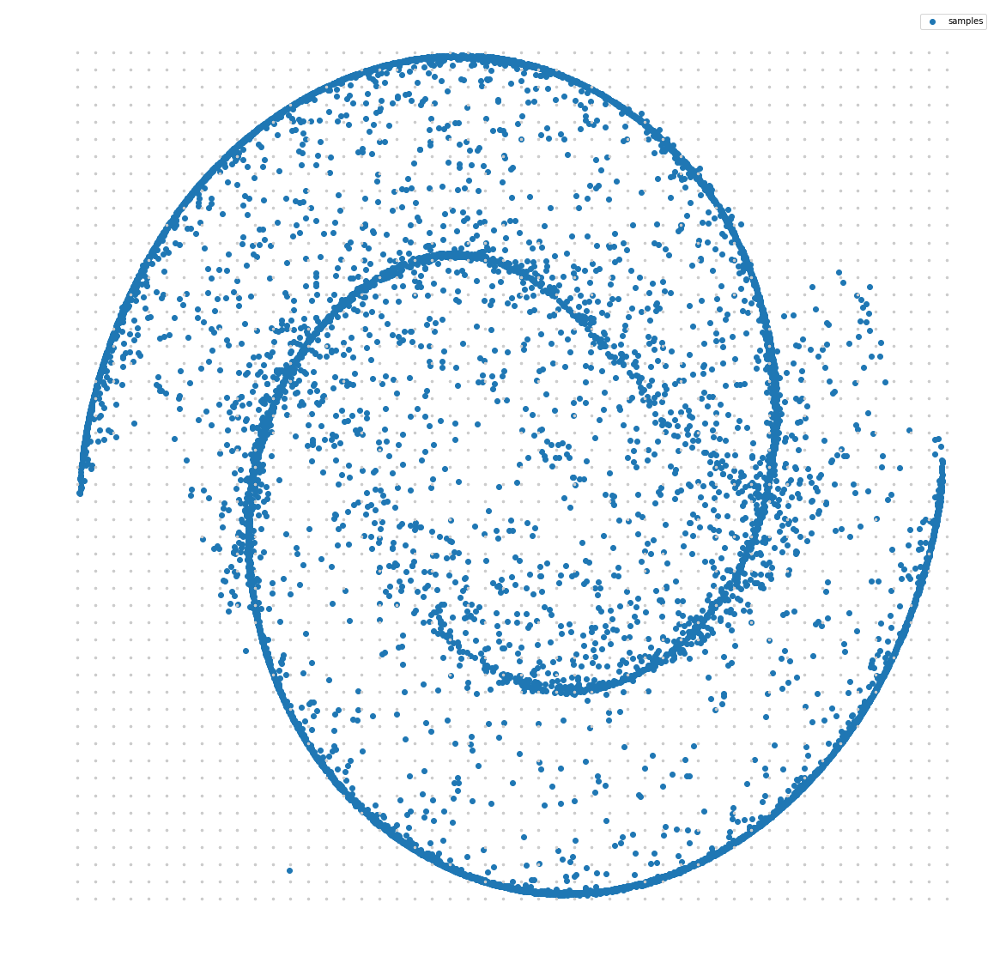

In [42]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

ax1.scatter(out_px_samples[:,0], out_px_samples[:,1], c=[train_0], label="samples")

ax1.scatter(x1_meshgrid[:,0], x1_meshgrid[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.axis('off')
plt.legend()
plt.show()

### AVAE

In [43]:
iw = 100
samples = np.expand_dims(np.random.normal(0., 1., (10000, 2)), 1).repeat(iw, 1).reshape(-1, z_dim)
out_px_samples = sess.run(avae_px_mu, feed_dict={avae_qz: samples}).reshape(-1, iw, x1.shape[-1]).mean(1)

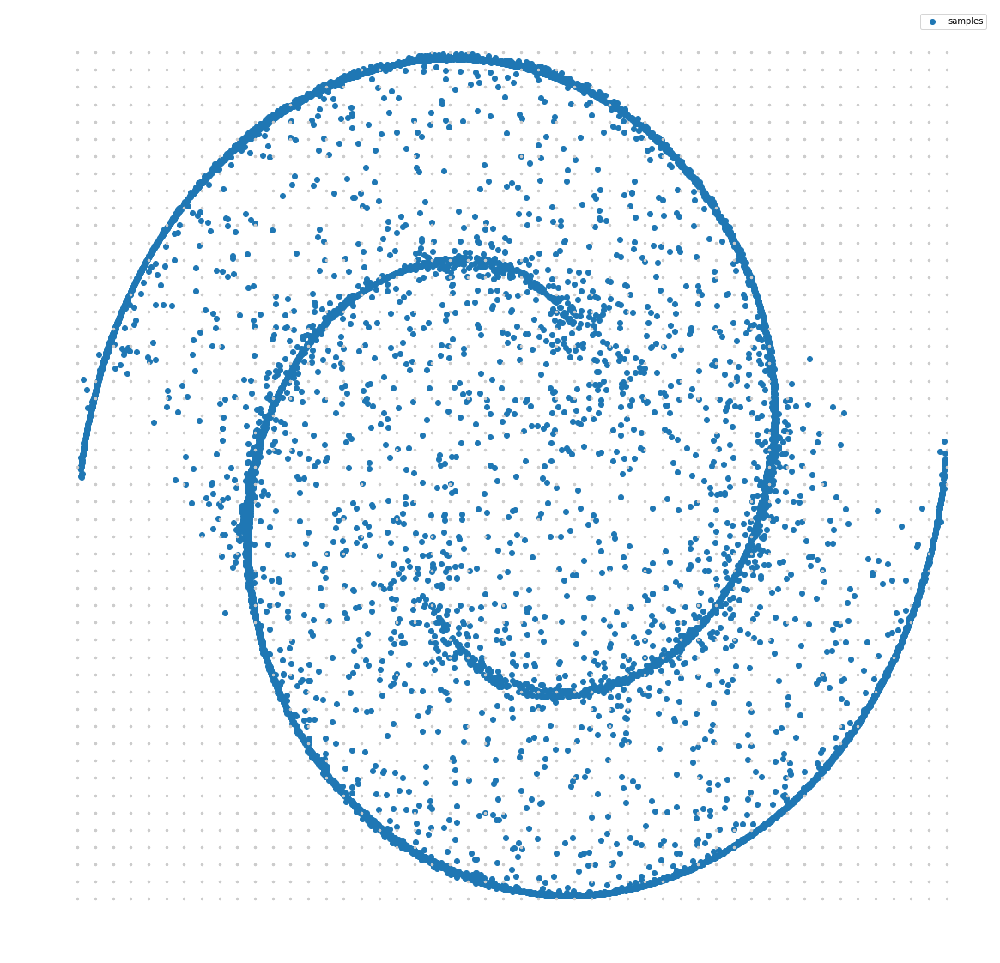

In [44]:
fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(1, 1, 1)

ax1.scatter(out_px_samples[:,0], out_px_samples[:,1], c=[train_0], label="samples")

ax1.scatter(x1_meshgrid[:,0], x1_meshgrid[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
        
ax1.axis('off')
plt.legend()
plt.show()

## Visualise density by using the ELBO

In [48]:
def plot_density(ph_x, ph_iw, ph_kl_temp, op_loss):
    nx, ny = (500, 500)
    def f(multiplier):
        x_min, x_max =  np.min(x1[:,0]) - multiplier, multiplier + np.max(x1[:,0]) 
        y_min, y_max = np.min(x1[:,1]) - multiplier, multiplier + np.max(x1[:,1])
        return [x_min, x_max, y_min, y_max]

    for i in range(5):
        print("Plotting scale %i:1."%(i+1))
        x_min, x_max, y_min, y_max = f(i*1)
        x = np.linspace(x_min, x_max, nx)
        y = np.linspace(y_min, y_max, ny)
        xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
        zv = np.zeros(xv.shape)
        for j in range(x.shape[0]):
            inp = np.append(xv[:, j:j+1], yv[:, j:j+1], axis=1)
            zv[:, j] = sess.run(op_loss, feed_dict={ph_x: inp, ph_kl_temp: 1., ph_iw: 50}).reshape(-1)[::-1]

        zv_rescaled = zv
        #zv_rescaled += zv.min()
        zv_rescaled = np.clip(zv_rescaled, -20000., zv_rescaled.max()) # TODO: Do something smarter here!
        #zv_rescaled = np.clip(zv_rescaled, 15., zv_rescaled.max())

        #zv_rescaled = (zv_rescaled - zv_rescaled.min()) / (zv_rescaled.max() - zv_rescaled.min())
        #zv_rescaled = 1-zv_rescaled

        plt.figure(figsize=(40, 40))
        plt.imshow(zv_rescaled, matplotlib.cm.get_cmap('binary_r'))
        plt.colorbar()
        plt.axis(aspect='image');
        plt.axis('off')
        plt.show()

### VAE

Plotting scale 1:1.


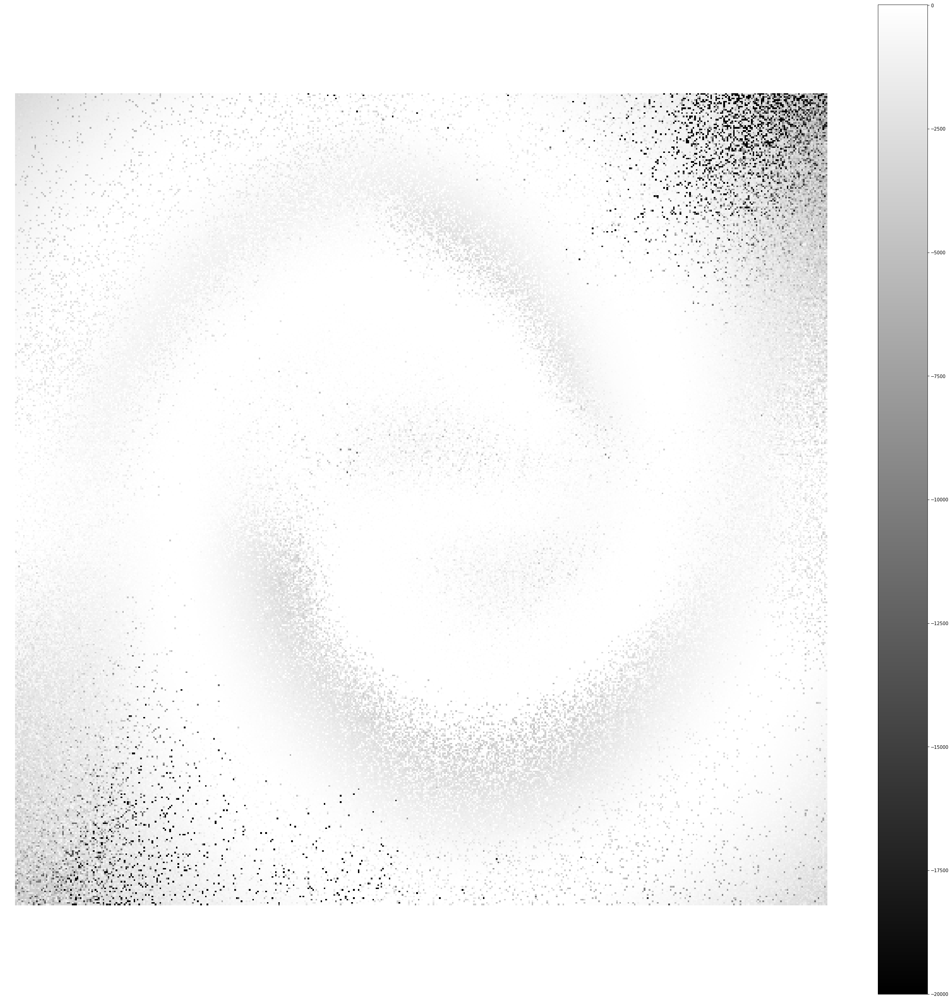

Plotting scale 2:1.


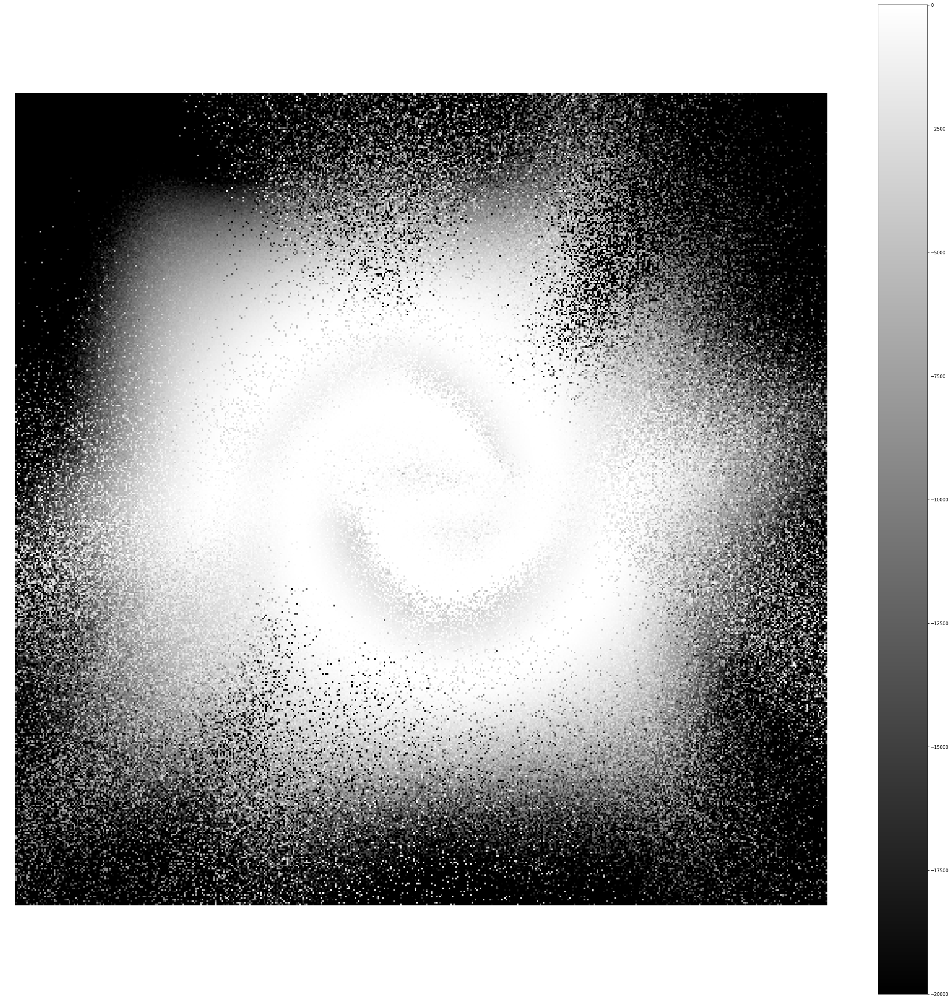

Plotting scale 3:1.


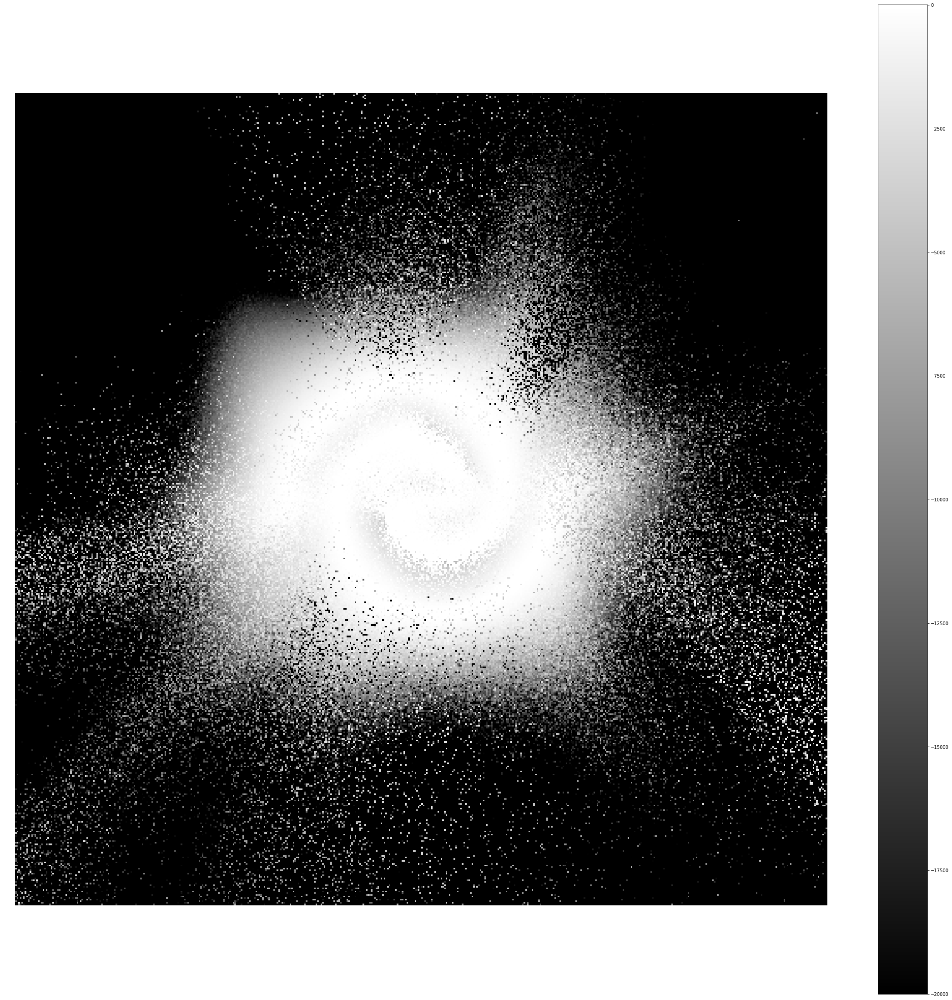

Plotting scale 4:1.


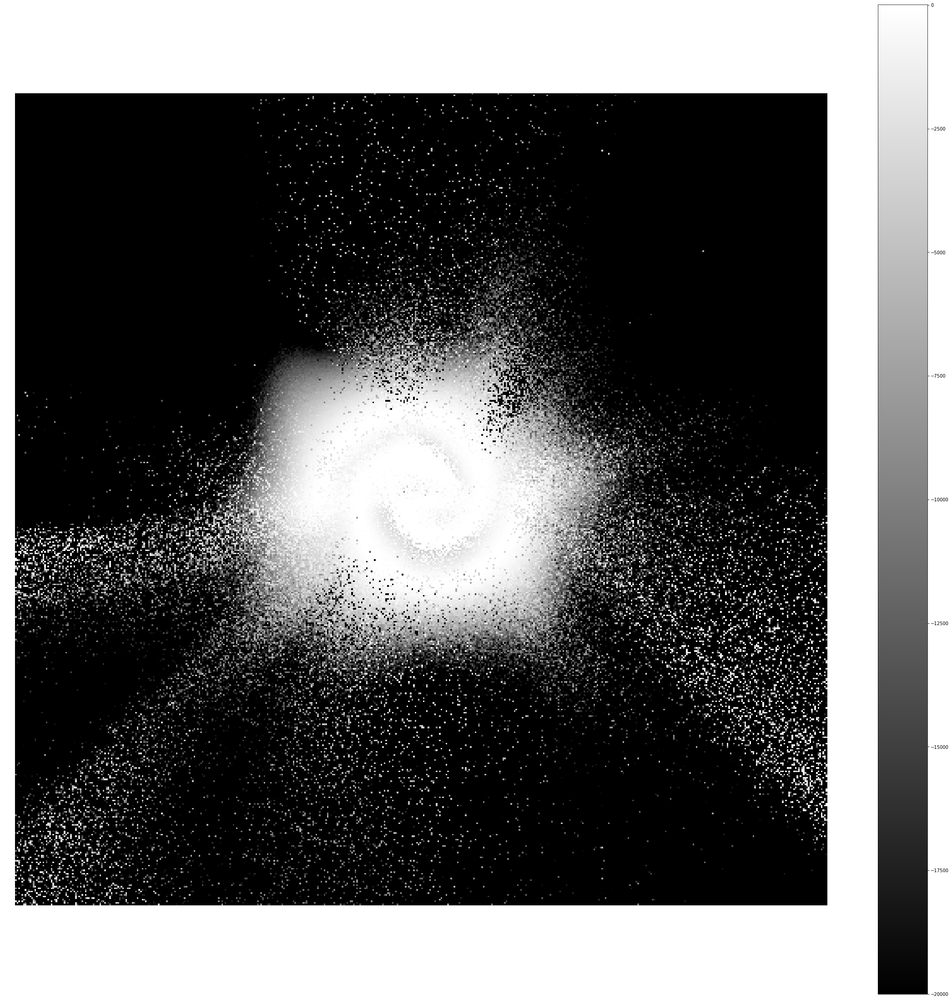

Plotting scale 5:1.


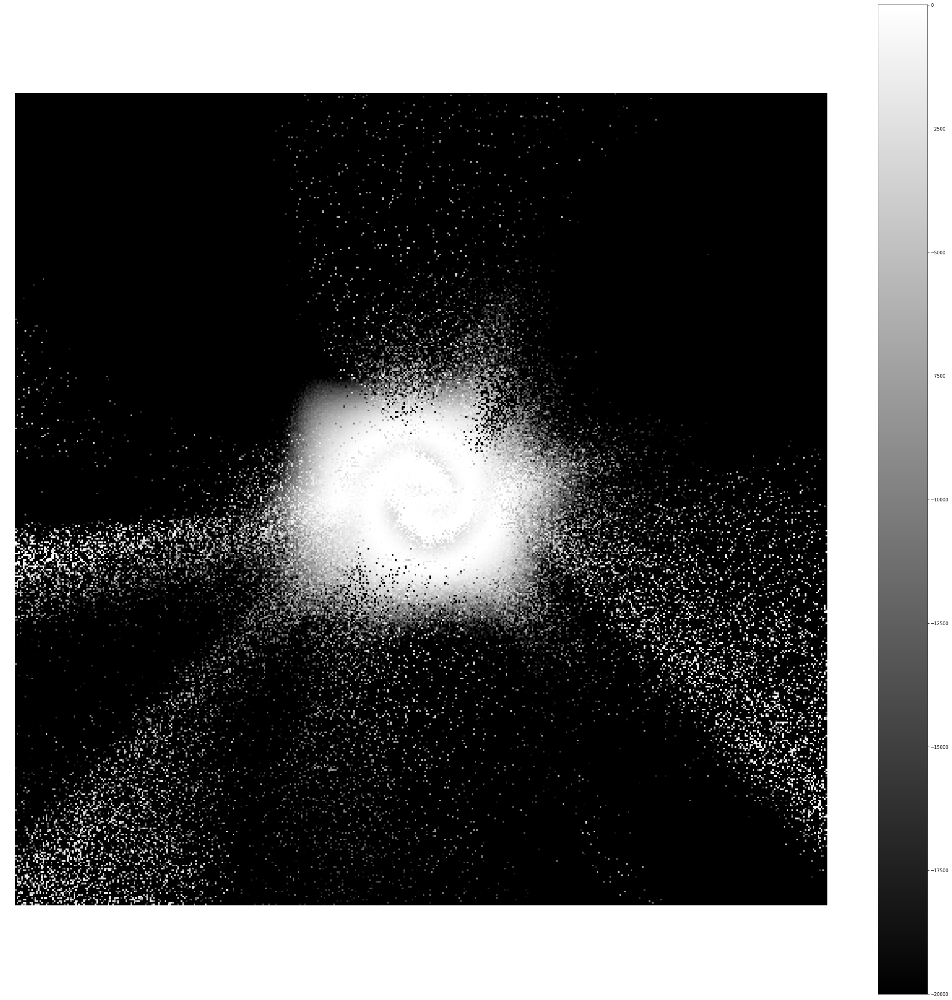

In [46]:
plot_density(vae_ph_x, vae_ph_iw, vae_ph_kl_temp, vae_op_loss)

### AVAE

Plotting scale 1:1.


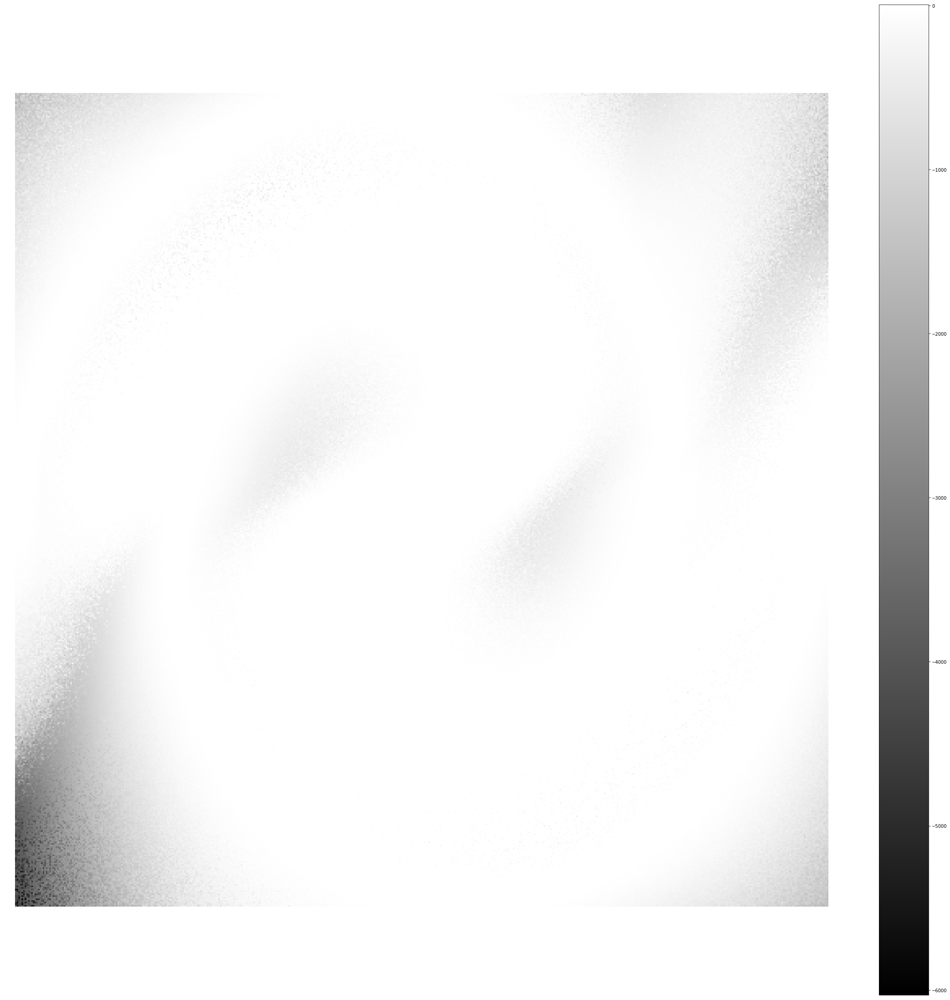

Plotting scale 2:1.


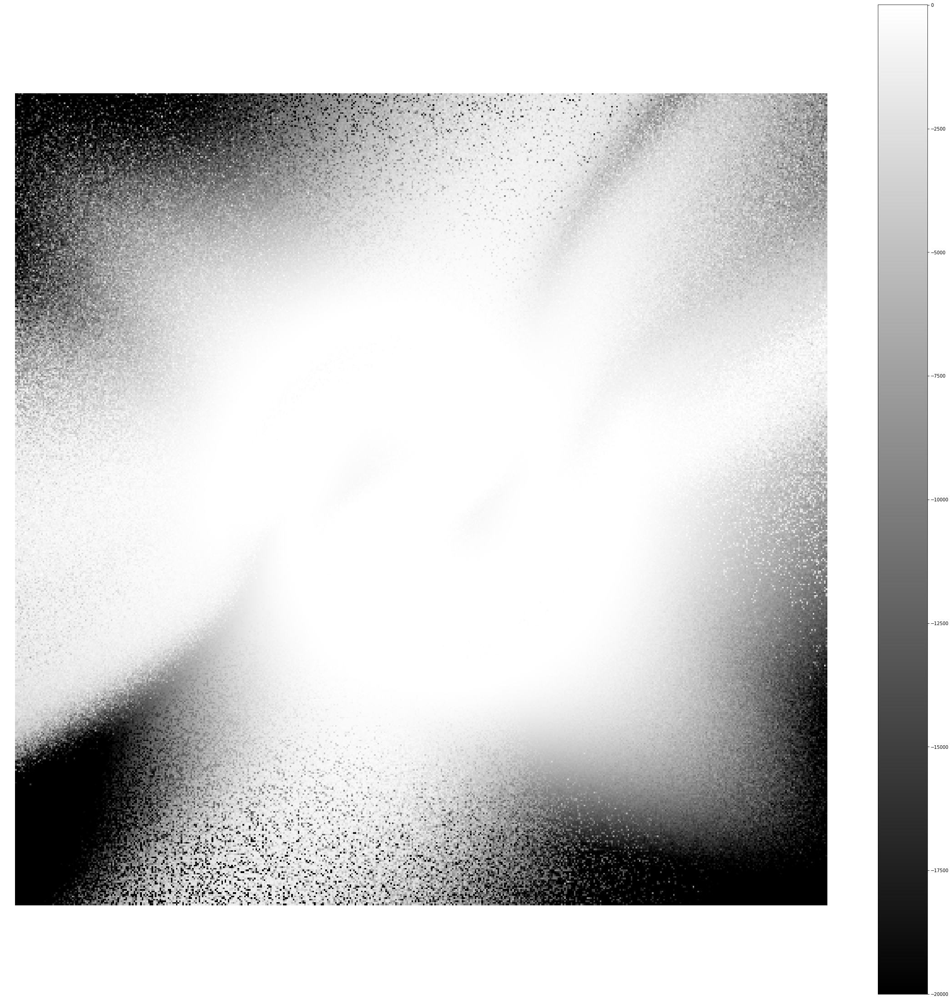

Plotting scale 3:1.


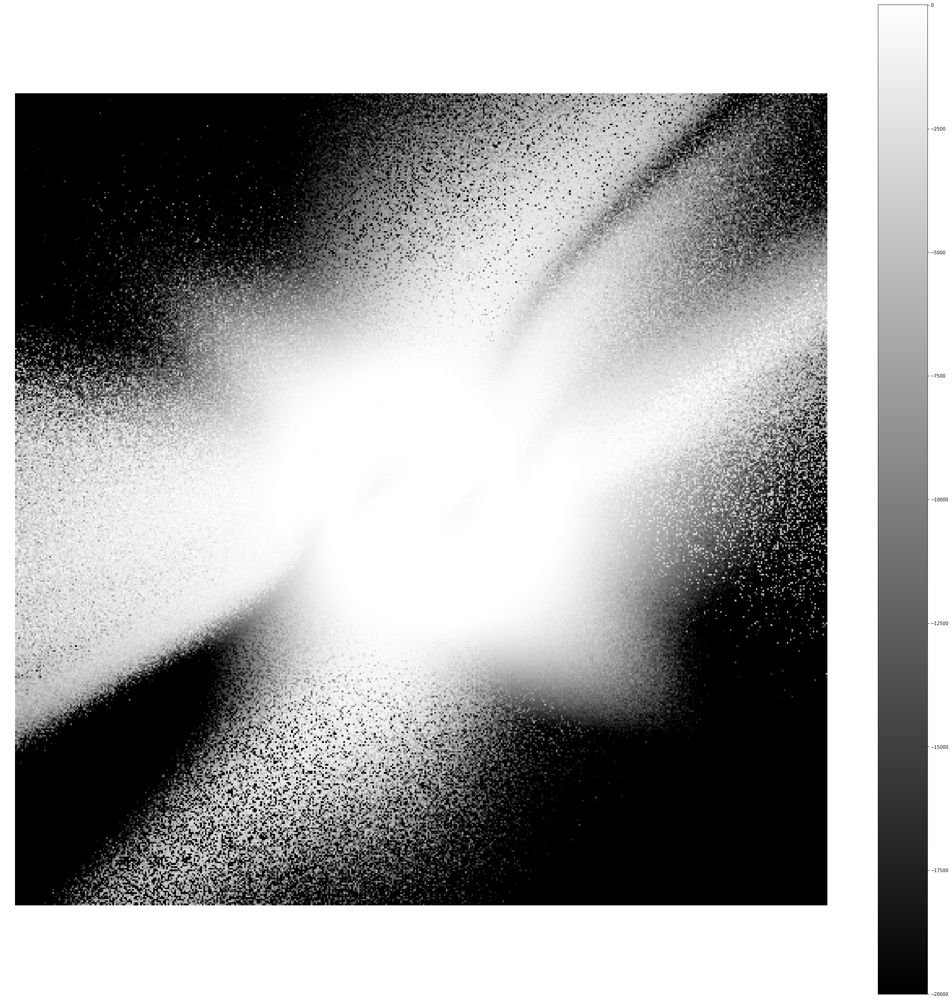

Plotting scale 4:1.


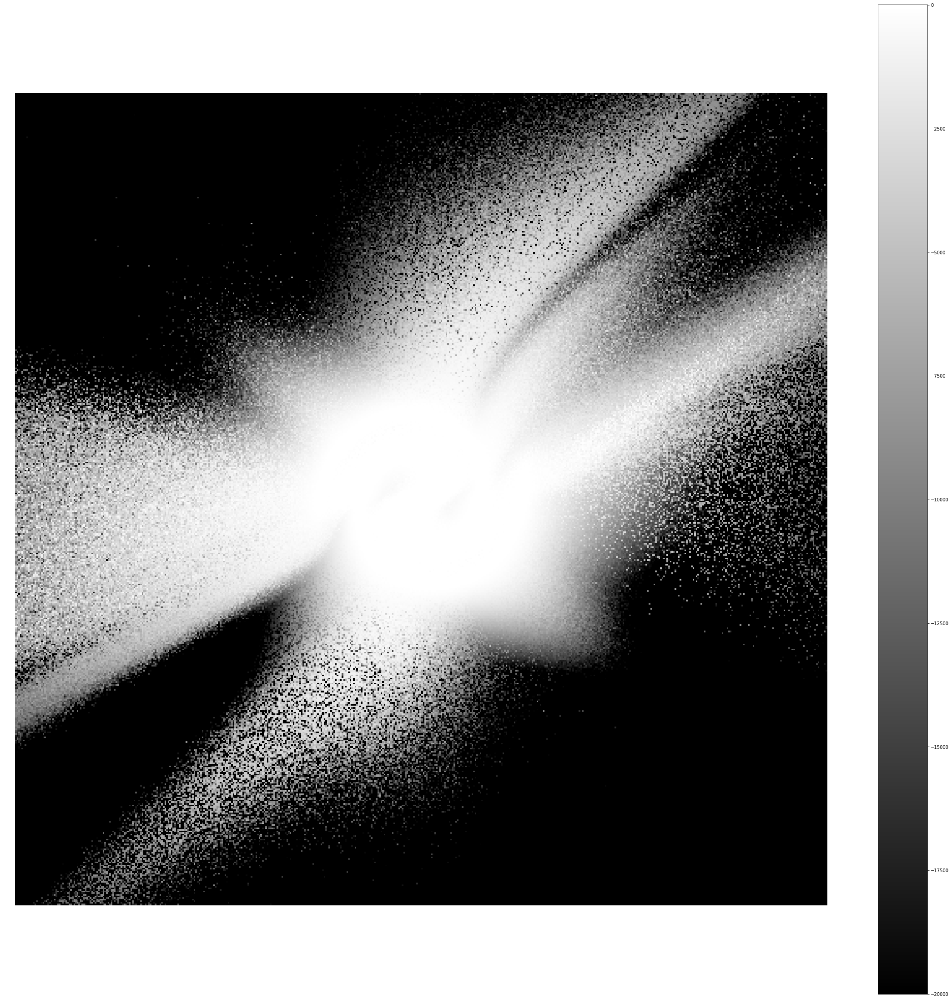

Plotting scale 5:1.


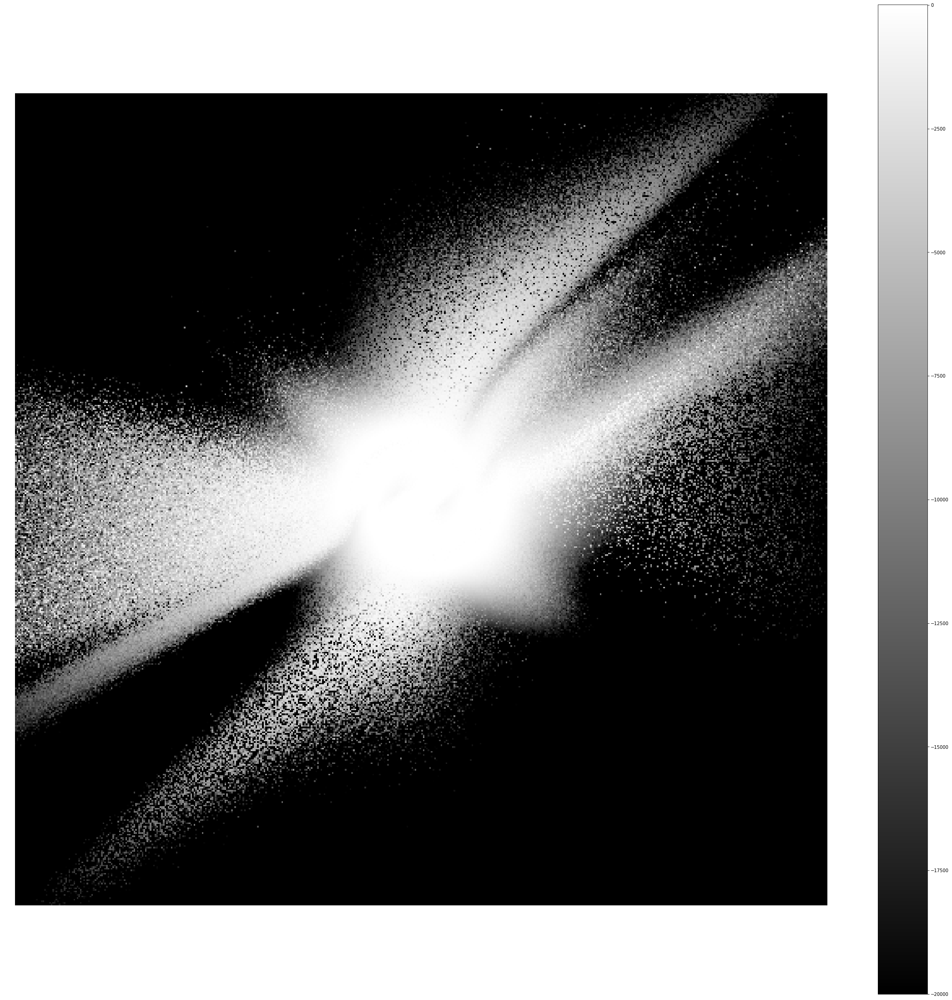

In [49]:
plot_density(avae_ph_x, avae_ph_iw, avae_ph_kl_temp, avae_op_loss)